Project: **S&P 500 Stock selection through technical analysis, timeseries forecasating and sentiment analysis**

Author: Siddharth Bookinkere

#Importing all necesssary libraries

##Importing the yfinance library

In [ ]:
! pip install yfinance --upgrade --no-cache-dir

In [ ]:
! pip install yfinance --upgrade --no-cache-dir --pre

In [ ]:
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf

#Importing stock data

##Getting all the ticker symbols and sectors of the S&P 500 stocks

In [ ]:
import pandas as pd

def get_sp500_symbols_and_sectors():
    sp500_url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
    sp500_df = pd.read_html(sp500_url)[0]
    sp500_symbols = sp500_df['Symbol'].tolist()
    sp500_sectors = sp500_df['GICS Sector'].tolist()
    symbols_and_sectors = dict(zip(sp500_symbols, sp500_sectors))
    return symbols_and_sectors

# Get the dictionary containing stock symbols and their corresponding sectors
sp500_symbols_and_sectors = get_sp500_symbols_and_sectors()


In [ ]:
sp500_symbols_and_sectors

{'MMM': 'Industrials',
 'AOS': 'Industrials',
 'ABT': 'Health Care',
 'ABBV': 'Health Care',
 'ACN': 'Information Technology',
 'ADBE': 'Information Technology',
 'AMD': 'Information Technology',
 'AES': 'Utilities',
 'AFL': 'Financials',
 'A': 'Health Care',
 'APD': 'Materials',
 'ABNB': 'Consumer Discretionary',
 'AKAM': 'Information Technology',
 'ALB': 'Materials',
 'ARE': 'Real Estate',
 'ALGN': 'Health Care',
 'ALLE': 'Industrials',
 'LNT': 'Utilities',
 'ALL': 'Financials',
 'GOOGL': 'Communication Services',
 'GOOG': 'Communication Services',
 'MO': 'Consumer Staples',
 'AMZN': 'Consumer Discretionary',
 'AMCR': 'Materials',
 'AEE': 'Utilities',
 'AAL': 'Industrials',
 'AEP': 'Utilities',
 'AXP': 'Financials',
 'AIG': 'Financials',
 'AMT': 'Real Estate',
 'AWK': 'Utilities',
 'AMP': 'Financials',
 'AME': 'Industrials',
 'AMGN': 'Health Care',
 'APH': 'Information Technology',
 'ADI': 'Information Technology',
 'ANSS': 'Information Technology',
 'AON': 'Financials',
 'APA': 'Ene

In [ ]:
# Get all the unique sectors
unique_sectors = {sector for sector in sp500_symbols_and_sectors.values()}

# Convert the set to a list if needed
unique_sectors_list = list(unique_sectors)

print(unique_sectors_list)


['Energy', 'Consumer Staples', 'Consumer Discretionary', 'Industrials', 'Materials', 'Utilities', 'Financials', 'Health Care', 'Information Technology', 'Communication Services', 'Real Estate']


In [ ]:
# Get all the unique tickers
tickers = list(sp500_symbols_and_sectors.keys())

print(tickers)


['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AES', 'AFL', 'A', 'APD', 'ABNB', 'AKAM', 'ALB', 'ARE', 'ALGN', 'ALLE', 'LNT', 'ALL', 'GOOGL', 'GOOG', 'MO', 'AMZN', 'AMCR', 'AEE', 'AAL', 'AEP', 'AXP', 'AIG', 'AMT', 'AWK', 'AMP', 'AME', 'AMGN', 'APH', 'ADI', 'ANSS', 'AON', 'APA', 'AAPL', 'AMAT', 'APTV', 'ACGL', 'ADM', 'ANET', 'AJG', 'AIZ', 'T', 'ATO', 'ADSK', 'ADP', 'AZO', 'AVB', 'AVY', 'AXON', 'BKR', 'BALL', 'BAC', 'BK', 'BBWI', 'BAX', 'BDX', 'BRK.B', 'BBY', 'BIO', 'TECH', 'BIIB', 'BLK', 'BX', 'BA', 'BKNG', 'BWA', 'BXP', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'BF.B', 'BLDR', 'BG', 'CDNS', 'CZR', 'CPT', 'CPB', 'COF', 'CAH', 'KMX', 'CCL', 'CARR', 'CTLT', 'CAT', 'CBOE', 'CBRE', 'CDW', 'CE', 'COR', 'CNC', 'CNP', 'CF', 'CHRW', 'CRL', 'SCHW', 'CHTR', 'CVX', 'CMG', 'CB', 'CHD', 'CI', 'CINF', 'CTAS', 'CSCO', 'C', 'CFG', 'CLX', 'CME', 'CMS', 'KO', 'CTSH', 'CL', 'CMCSA', 'CMA', 'CAG', 'COP', 'ED', 'STZ', 'CEG', 'COO', 'CPRT', 'GLW', 'CPAY', 'CTVA', 'CSGP', 'COST', 'CTRA', 'CCI', 'CSX', 'CMI', 'C

In [ ]:
# Number of unique tickers
num_unique_tickers = len(tickers)

print("Number of unique tickers:", num_unique_tickers)


Number of unique tickers: 503


##Getting the open, high, low, close and volume of each ticker for a 1 year 1 day period

In [ ]:
ohlcv_data={}

for ticker in tickers:
  temp=yf.download(ticker, period='1y',interval='1d')
  temp.dropna(how='any',inplace=True)
  ohlcv_data[ticker]=temp

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

$BF.B: possibly delisted; No price data found  (period=1y)



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******

#Defining our technical indicators

##1. RSI
 Relative Strength Index (RSI) is a momentum oscillator that measures the speed and change of price movements. It oscillates between 0 and 100 and is typically used to identify overbought or oversold conditions in a stock or asset. RSI is calculated based on the average gains and losses over a specified period, usually 14 days. When the RSI is above 70, it's considered overbought, indicating a potential sell signal. Conversely, when the RSI is below 30, it's considered oversold, suggesting a potential buy signal.

In [ ]:
import numpy as np

def RSI(DF,n=7):
  df=DF.copy()
  df['change']=df["Adj Close"]-df["Adj Close"].shift(1)
  df['gain']=np.where(df['change']>=0,df["change"],0)
  df['loss']=np.where(df['change']<0,-1*df["change"],0)
  df["avgGain"]=df["gain"].ewm(alpha=1/n, min_periods=n).mean()
  df["avgLoss"]=df["loss"].ewm(alpha=1/n, min_periods=n).mean()
  df["rs"]=df["avgGain"]/df["avgLoss"]
  df["rsi"]=100-(100/(1+df["rs"]))
  return df["rsi"]

###RSI filter criteria

We want the stocks where:

1. RSI is between 30 and 40

2. RSI is moving upward

In [ ]:
def filter_stocks_rsi(tickers, ohlcv_data, lower_threshold_rsi=30, upper_threshold_rsi=40):
    undervalued_stocks_rsi = []
    for ticker in tickers:
        df = ohlcv_data[ticker]
        if not df.empty:
            rsi_values = RSI(df, n=7)
            current_rsi = rsi_values.iloc[-1]
            previous_rsi = rsi_values.iloc[-2]
            if (
                lower_threshold_rsi <= current_rsi <= upper_threshold_rsi
                and current_rsi > previous_rsi
            ):
                undervalued_stocks_rsi.append(ticker)
    return undervalued_stocks_rsi

# Use the function to filter the stocks based on RSI
undervalued_stocks_rsi = filter_stocks_rsi(tickers, ohlcv_data)

# Print the undervalued stocks
print(undervalued_stocks_rsi)


['TECH', 'CTLT', 'CBOE', 'EL', 'IT', 'MKTX', 'ORCL', 'RMD', 'TMO']


In [ ]:
print("We have", len(undervalued_stocks_rsi), "stocks where the conditions are satisfied for RSI")

We have 9 stocks where the conditions are satisfied for RSI


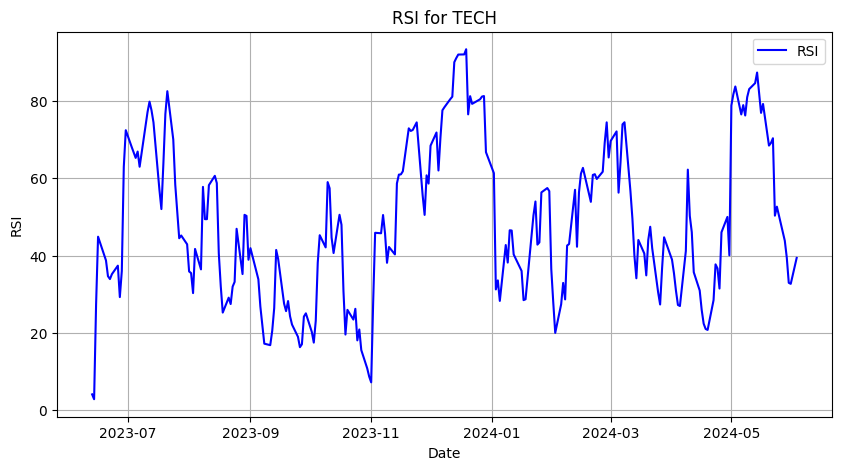

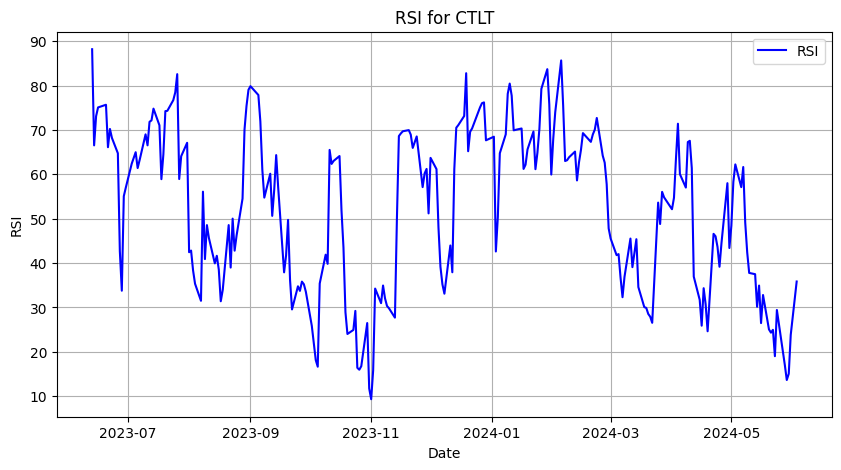

In [ ]:
import matplotlib.pyplot as plt

def visualize_rsi(tickers, ohlcv_data, n=7):
    for ticker in tickers[:2]:  # Selecting the first two stocks
        df = ohlcv_data[ticker]
        if not df.empty:
            rsi_values = RSI(df, n=n)
            plt.figure(figsize=(10, 5))
            plt.plot(df.index, rsi_values, label='RSI', color='blue')
            plt.title(f'RSI for {ticker}')
            plt.xlabel('Date')
            plt.ylabel('RSI')
            plt.legend()
            plt.grid(True)
            plt.show()

# Visualize RSI for the first two stocks in the list
visualize_rsi(undervalued_stocks_rsi, ohlcv_data)


##2. ATR
The Average True Range (ATR) measures market volatility by calculating the average of true ranges over a specified period. It helps traders gauge potential price movement and adjust risk management strategies accordingly. A higher ATR indicates higher volatility, while a lower ATR suggests lower volatility. ATR can be used to set stop-loss levels, determine position size, and adapt trading strategies based on current market conditions. Overall, ATR provides valuable insights into market volatility, aiding traders in making informed decisions.

In [ ]:
def ATR(DF,n=14):
  df=DF.copy()
  df['H-L']=df['High']-df['Low']
  df['H-PC']=df['High']-df['Adj Close'].shift(1) #High-Previous Close
  df['L-PC']=df['Low']-df['Adj Close'].shift(1)  #Low-Previos Close
  df["TR"]= df[["H-L",'H-PC','L-PC']].max(axis=1,skipna=False)
  df['ATR']=df['TR'].ewm(com=n, min_periods=n).mean()
  return df["ATR"]

##3. ADX

The Average Directional Index (ADX) is a technical indicator used to measure the strength and direction of a trend. Developed by J. Welles Wilder, it helps traders identify whether a market is trending or ranging. ADX is calculated based on the difference between two other indicators, namely the Positive Directional Index (+DI) and the Negative Directional Index (-DI). ADX values range from 0 to 100, with higher values indicating a stronger trend. Traders often use ADX alongside other indicators to make more informed trading decisions.

In [ ]:
def ADX(DF,n=20):
  df=DF.copy()
  df["ATR"]=ATR(df,n)
  df["upmove"]=df["High"]-df["High"].shift(1)
  df["downmove"]=df["Low"].shift(1)-df["Low"]
  df["+dm"]=np.where((df["upmove"]>df["downmove"])) & (df["upmove"]>0,df["upmove"],0)
  df["-dm"]=np.where((df["downmove"]>df["upmove"])) & (df["downmove"]>0,df["upmove"],0)
  df["+di"]=100*(df["+dm"]/df["ATR"]).ewm(span=n,min_periods=n).mean()
  df["-di"]=100*(df["-dm"]/df["ATR"]).ewm(span=n,min_periods=n).mean()
  df["ADX"]= 100*(abs(df["+di"] - df["-di"])/ (df["+di"] + df["-di"])).ewm(span=n,min_periods=n).mean()
  return df["ADX"]





###ADX filter criteria

We want the stocks where:

1. +di line is above the -di line

2. ADX is between 20 and 25

3. ADX is moving upward

In [ ]:
def filter_stocks_adx(tickers, ohlcv_data,):
    undervalued_stocks_adx = []
    for ticker, df in ohlcv_data.items():
        if not df.empty:
                # Calculate +DI, -DI, and ADX
                df["ATR"] = ATR(df, n=14)
                df["upmove"] = df["High"] - df["High"].shift(1)
                df["downmove"] = df["Low"].shift(1) - df["Low"]
                df["+dm"] = np.where((df["upmove"] > df["downmove"]) & (df["upmove"] > 0), df["upmove"], 0)
                df["-dm"] = np.where((df["downmove"] > df["upmove"]) & (df["downmove"] > 0), df["downmove"], 0)
                df["+di"] = 100 * (df["+dm"] / ATR(df, n=14)).ewm(span=20, min_periods=20).mean()
                df["-di"] = 100 * (df["-dm"] / ATR(df, n=14)).ewm(span=20, min_periods=20).mean()
                df["adx_data"] = 100 * (abs(df["+di"] - df["-di"]) / (df["+di"] + df["-di"])).ewm(span=20, min_periods=20).mean()

                # Check if +DI is above -DI, ADX is between 20 and 25, and current ADX is higher than previous two ADX values
                last_index = -1
                if (
                    df["+di"].iloc[last_index] > df["-di"].iloc[last_index] and
                    20 < df["adx_data"].iloc[last_index] < 25 and
                    df["adx_data"].iloc[last_index] > df["adx_data"].iloc[last_index - 1] and
                    df["adx_data"].iloc[last_index - 1] > df["adx_data"].iloc[last_index - 2]
                ):
                    undervalued_stocks_adx.append(ticker)

    return undervalued_stocks_adx

# Use the function to filter the stocks
undervalued_stocks_adx = filter_stocks_adx(tickers, ohlcv_data)

# Print the undervalued stocks
print(undervalued_stocks_adx)


['AMT', 'APTV', 'CCI', 'DVA', 'EXPD', 'MHK', 'NWSA', 'NWS', 'OTIS', 'RL', 'REG', 'TPR']


In [ ]:
print("We have", len(undervalued_stocks_adx), "stocks where the conditions are satisfied for ADX.")

We have 12 stocks where the conditions are satisfied for ADX.


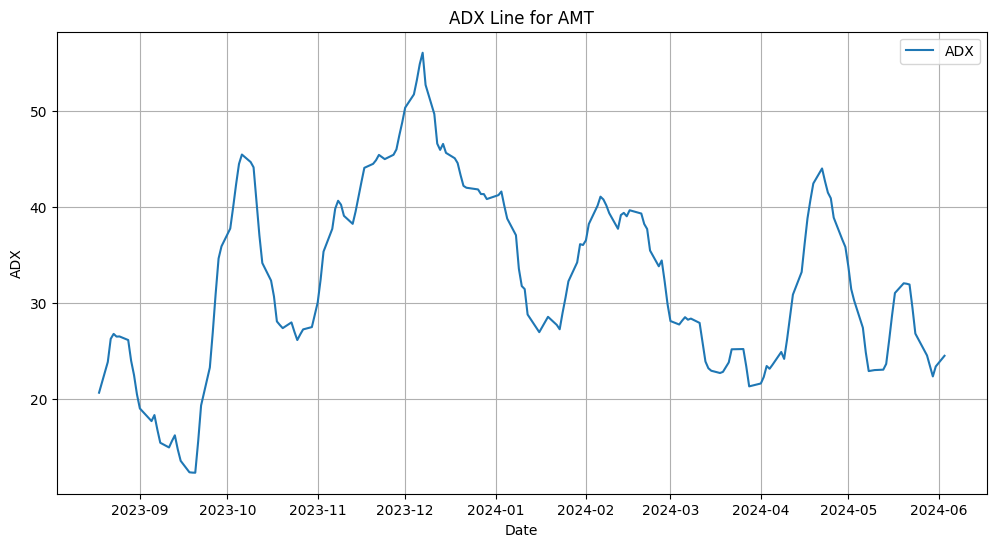

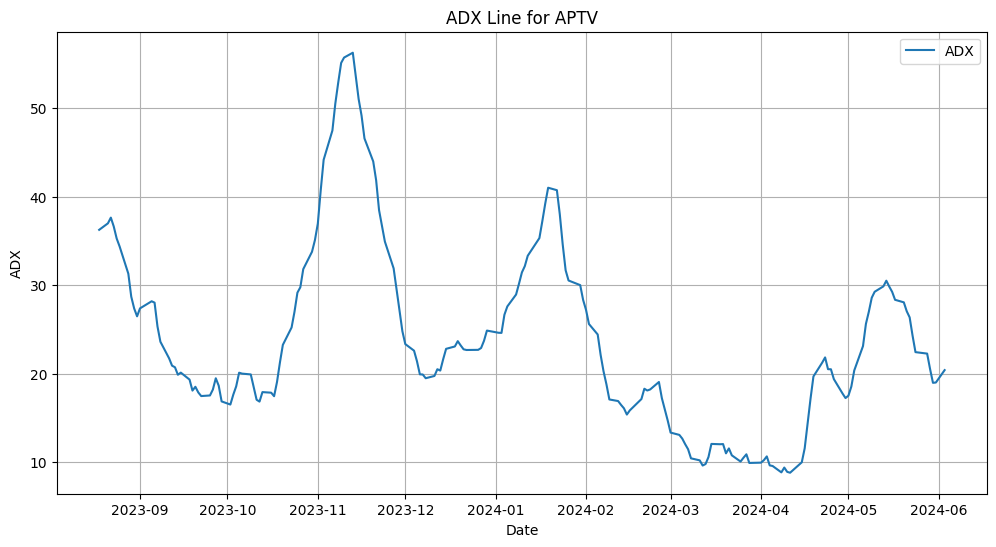

In [ ]:
import matplotlib.pyplot as plt

def plot_adx(df, ticker):
    plt.figure(figsize=(12,6))
    plt.plot(df.index, df["adx_data"], label='ADX')
    plt.title(f'ADX Line for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('ADX')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot ADX line for the first 2 stocks
for ticker in undervalued_stocks_adx[:2]:
    plot_adx(ohlcv_data[ticker], ticker)


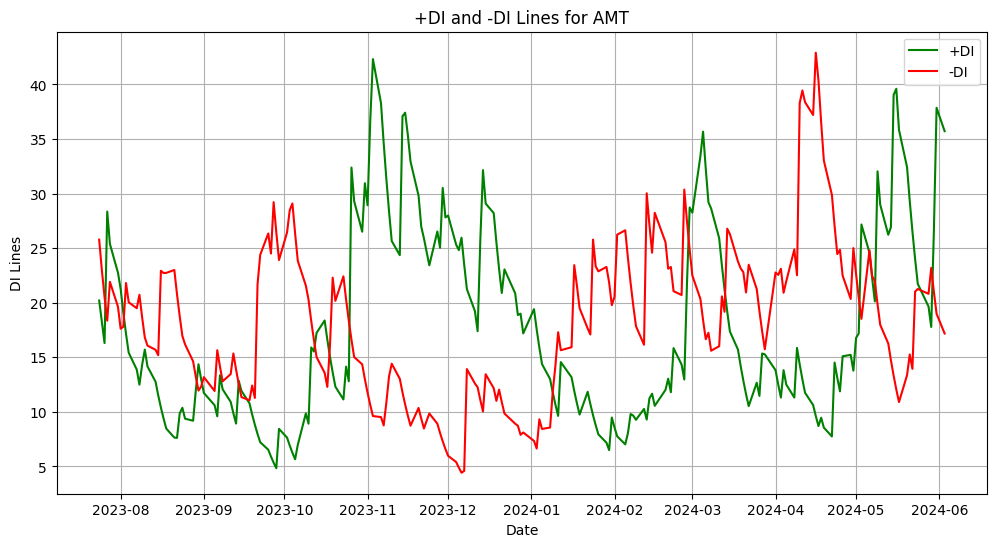

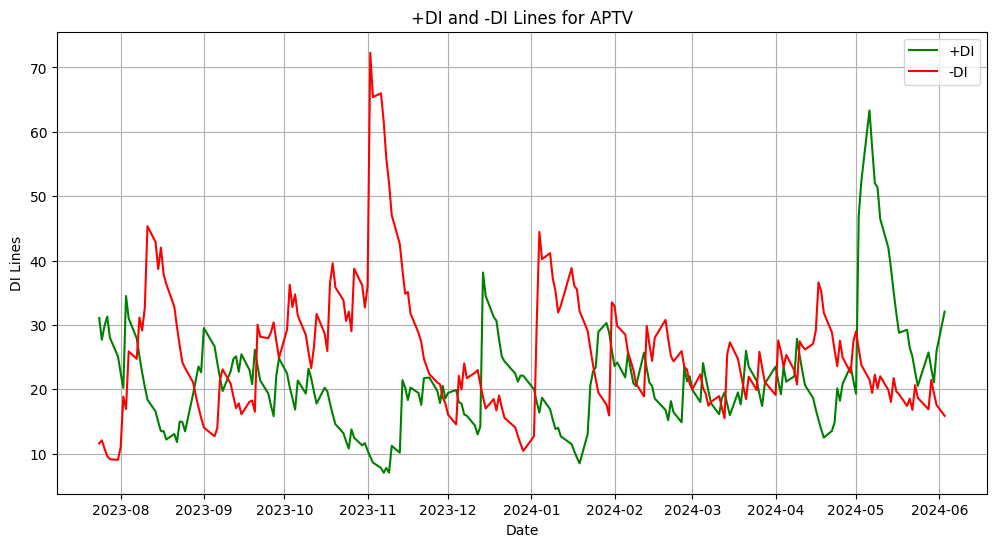

In [ ]:
import matplotlib.pyplot as plt

def plot_di(df, ticker):
    plt.figure(figsize=(12,6))
    plt.plot(df.index, df["+di"], label='+DI', color='green')
    plt.plot(df.index, df["-di"], label='-DI', color='red')
    plt.title(f'+DI and -DI Lines for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('DI Lines')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot +DI and -DI lines for the first 2 stocks
for ticker in undervalued_stocks_adx[:2]:
    plot_di(ohlcv_data[ticker], ticker)


##4. EMA
EMA stands for Exponential Moving Average. It's a type of moving average that places more weight on recent data points, making it more responsive to price changes compared to a simple moving average (SMA). The EMA calculation assigns exponentially decreasing weights to older data points, with the most recent data points contributing more significantly to the average. EMA is commonly used in technical analysis to identify trends, potential reversals, and to smooth out price data for better analysis. It's particularly useful for traders who want to react quickly to market changes while still considering historical price movements.

###EMA filter criteria

We want the stocks where:

1. 20 EMA is moving above the 50 EMA

In [ ]:
def ema(df, span=20):
    return df['Close'].ewm(span=span, min_periods=span).mean()

def filter_stocks_ema(ohlcv_data):
    undervalued_stocks_ema = []
    for ticker in tickers:
        df = ohlcv_data[ticker]
        if not df.empty:
            ema_20 = ema(df, span=20)
            ema_50 = ema(df, span=50)
            if ema_20.iloc[-1] > ema_50.iloc[-1]:
                undervalued_stocks_ema.append(ticker)
    return undervalued_stocks_ema

# Use the function to filter the undervalued stocks from the filtered list
undervalued_stocks_ema = filter_stocks_ema(ohlcv_data)

# Print the undervalued stocks
print(undervalued_stocks_ema)


['MMM', 'AES', 'AFL', 'A', 'APD', 'ALB', 'LNT', 'ALL', 'GOOGL', 'GOOG', 'MO', 'AMZN', 'AMCR', 'AEP', 'AXP', 'AIG', 'AMT', 'AWK', 'AMP', 'AMGN', 'APH', 'ADI', 'AAPL', 'AMAT', 'APTV', 'ACGL', 'ADM', 'ANET', 'AJG', 'T', 'ADP', 'AVB', 'AVY', 'BKR', 'BALL', 'BAC', 'BK', 'BBWI', 'BBY', 'TECH', 'BIIB', 'BKNG', 'BWA', 'BSX', 'AVGO', 'BRO', 'BG', 'CPT', 'CPB', 'CARR', 'CNP', 'CHRW', 'SCHW', 'CVX', 'CMG', 'CB', 'CHD', 'CINF', 'CTAS', 'C', 'CFG', 'CMS', 'KO', 'CL', 'CAG', 'ED', 'CEG', 'GLW', 'CTVA', 'COST', 'CTRA', 'CMI', 'DHR', 'DVA', 'DECK', 'DAL', 'FANG', 'DLR', 'DFS', 'D', 'DPZ', 'DOV', 'DOW', 'DTE', 'DUK', 'DD', 'EMN', 'ETN', 'EBAY', 'ECL', 'EIX', 'EW', 'EA', 'ELV', 'LLY', 'EMR', 'ENPH', 'ETR', 'EQT', 'EQR', 'ESS', 'EG', 'EVRG', 'EXC', 'EXPD', 'EXR', 'XOM', 'FICO', 'FIS', 'FITB', 'FSLR', 'FE', 'FMC', 'FOXA', 'FOX', 'FCX', 'GRMN', 'GE', 'GEN', 'GNRC', 'GD', 'GIS', 'GM', 'GS', 'HIG', 'HAS', 'HCA', 'DOC', 'HSY', 'HPE', 'HON', 'HWM', 'HPQ', 'HUBB', 'HUM', 'HBAN', 'INCY', 'IR', 'PODD', 'ICE', 'IF

In [ ]:
print("We have", len(undervalued_stocks_ema),  "stocks where the conditions are satisfied for EMA")

We have 271 stocks where the conditions are satisfied for EMA


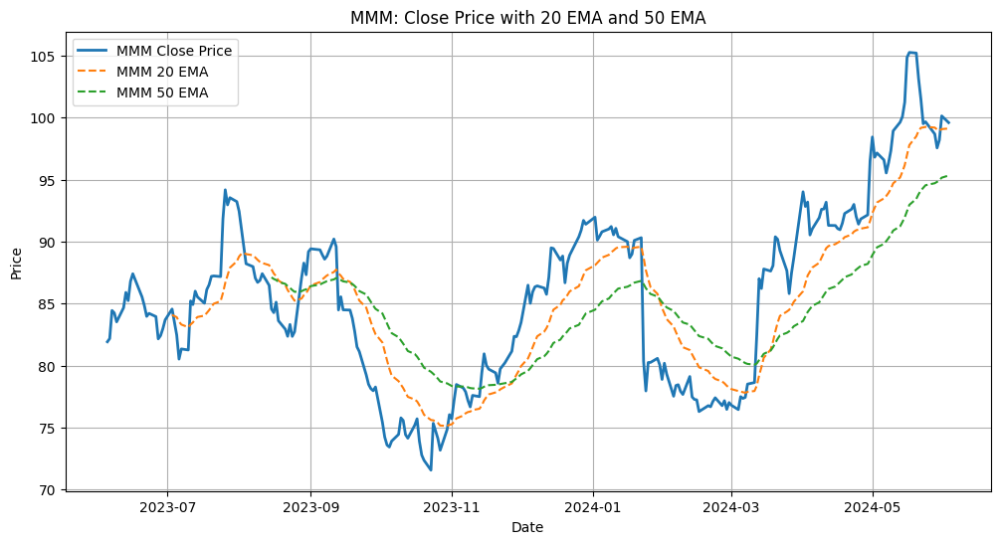

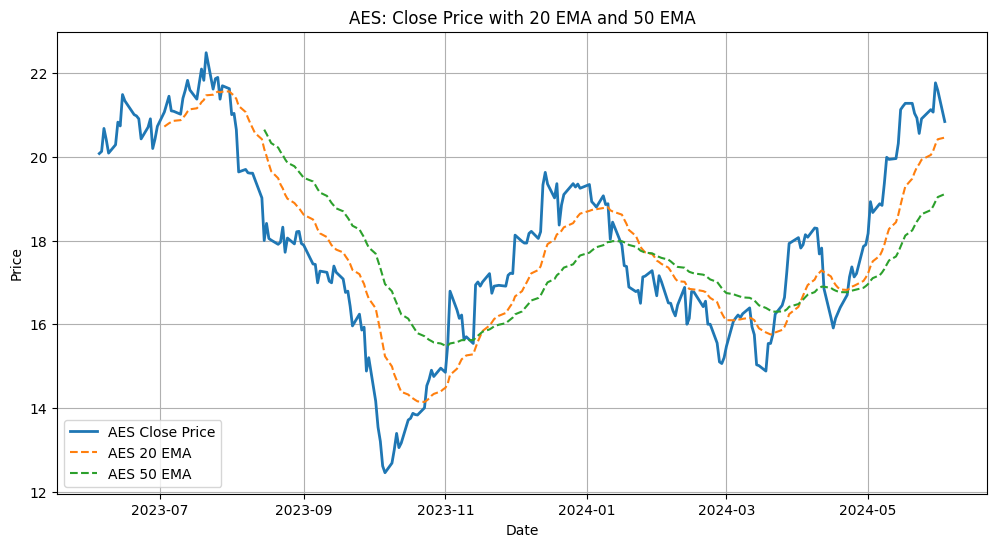

In [ ]:
import matplotlib.pyplot as plt

def plot_undervalued_stocks_ema(undervalued_stocks_ema, ohlcv_data):
    for i, ticker in enumerate(undervalued_stocks_ema[:2], start=1):
        plt.figure(figsize=(12, 6))
        df = ohlcv_data[ticker]
        ema_20 = df['Close'].ewm(span=20, min_periods=20).mean()
        ema_50 = df['Close'].ewm(span=50, min_periods=50).mean()

        # Plotting closing prices
        plt.plot(df.index, df['Close'], label=f'{ticker} Close Price', linewidth=2)

        # Plotting EMAs
        plt.plot(df.index, ema_20, label=f'{ticker} 20 EMA', linestyle='--')
        plt.plot(df.index, ema_50, label=f'{ticker} 50 EMA', linestyle='--')

        plt.title(f'{ticker}: Close Price with 20 EMA and 50 EMA')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

# Plot the trending stocks separately for the first 2 stocks
plot_undervalued_stocks_ema(undervalued_stocks_ema, ohlcv_data)


##5. MACD

In [ ]:
def MACD(DF,a=12,b=26,c=9):
  df=DF.copy()
  df["ma_fast"]=df["Adj Close"].ewm(span=a,min_periods=a).mean()
  df["ma_slow"]=df["Adj Close"].ewm(span=b,min_periods=b).mean()
  df['macd']=df["ma_fast"]-df["ma_slow"]
  df["signal"]=df["macd"].ewm(span=c,min_periods=c).mean()
  return df.loc[:,['macd','signal']]

###MACD filter criteria

We want the stocks where:

1. MACD>0
2. MACD line is above the signal line

In [ ]:
def filter_stocks_macd(ohlcv_data):
    undervalued_stocks_macd = []
    for ticker in tickers:
        df = ohlcv_data.get(ticker)
        if df is not None and not df.empty:
            macd_data = MACD(df)
            last_macd = macd_data['macd'].iloc[-1]
            last_signal = macd_data['signal'].iloc[-1]
            if last_macd > 0 and last_macd > last_signal:
                undervalued_stocks_macd.append(ticker)
    return undervalued_stocks_macd

# Filter stocks based on MACD criteria
undervalued_stocks_macd = filter_stocks_macd(ohlcv_data)

# Print the stocks where MACD is greater than 0 and the MACD line is above the signal line
print(undervalued_stocks_macd)


['AMD', 'AFL', 'APD', 'AMT', 'ADI', 'ADM', 'T', 'BBWI', 'BBY', 'BG', 'CCL', 'CNP', 'CF', 'CHTR', 'CB', 'GLW', 'COST', 'CTRA', 'CCI', 'DVA', 'DECK', 'DD', 'EBAY', 'EA', 'LLY', 'ENPH', 'EXPD', 'FSLR', 'FOXA', 'FOX', 'HCA', 'HPQ', 'HUM', 'INCY', 'IP', 'ISRG', 'JCI', 'KIM', 'LW', 'MRO', 'MCK', 'MHK', 'MOS', 'NTAP', 'NFLX', 'NWSA', 'NWS', 'NKE', 'NVDA', 'OTIS', 'PKG', 'QCOM', 'RL', 'RTX', 'REG', 'ROST', 'SPG', 'SYK', 'TMUS', 'TROW', 'TTWO', 'TPR', 'TJX', 'UHS', 'VTR', 'VZ', 'VRTX', 'WMT', 'WELL', 'WRK']


In [ ]:
print("We have", len(undervalued_stocks_macd),  "stocks where the conditions are satisfied for MACD")

We have 70 stocks where the conditions are satisfied for MACD


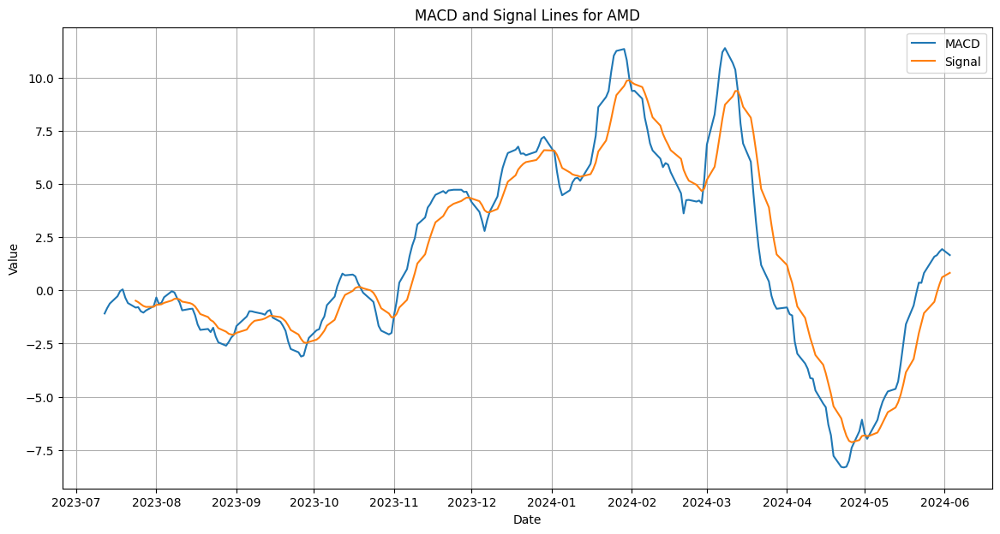

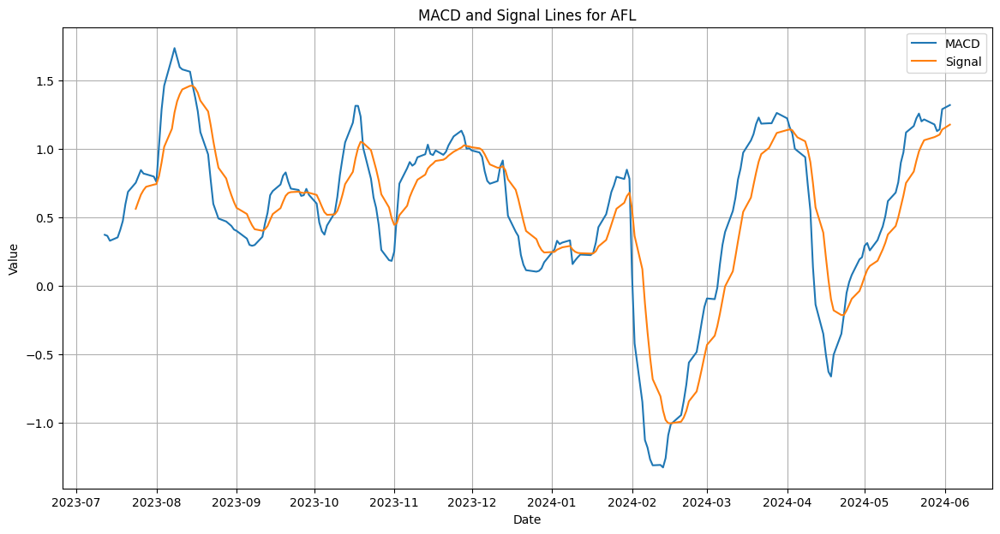

In [ ]:
import matplotlib.pyplot as plt

def plot_macd(ohlcv_data, undervalued_stocks_macd):
    # Plot settings
    for i in range(min(len(undervalued_stocks_macd), 2)):
        ticker = undervalued_stocks_macd[i]
        plt.figure(figsize=(14, 7))

        # Plot MACD and signal lines for the current stock
        df = ohlcv_data.get(ticker)
        if df is not None and not df.empty:
            macd_data = MACD(df)
            plt.plot(macd_data.index, macd_data['macd'], label='MACD')
            plt.plot(macd_data.index, macd_data['signal'], label='Signal')

            # Add title and legend
            plt.title(f'MACD and Signal Lines for {ticker}')
            plt.legend()

            # Add labels and grid
            plt.xlabel('Date')
            plt.ylabel('Value')
            plt.grid(True)

            # Display the plot
            plt.show()

# Plot MACD and signal lines for the first two stocks in undervalued_stocks_macd
plot_macd(ohlcv_data, undervalued_stocks_macd[:2])


##Common stocks

###Getting the common stocks from the lists of the following technical indicators:

1. RSI
2. ADX
3. EMA
4. MACD

In [ ]:
# Get the common stocks among all lists
common_stocks_all = set(undervalued_stocks_rsi) & set(undervalued_stocks_adx) & set(undervalued_stocks_ema) & set(undervalued_stocks_macd)

# Convert the set back to a list if needed
common_stocks_all_list = list(common_stocks_all)

# Print the common stocks
print(common_stocks_all_list)


[]


In [ ]:
print("We have", len(common_stocks_all_list),  "stocks where the conditions are satisfied for RSI, ADX, EMA and MACD")

We have 0 stocks where the conditions are satisfied for RSI, ADX, EMA and MACD


###Getting the common stocks from the lists of the following technical indicators:

1. ADX
2. EMA
3. MACD

In [ ]:
# Get the common stocks among all lists
common_stocks_3 = set(undervalued_stocks_adx) & set(undervalued_stocks_ema) & set(undervalued_stocks_macd)

# Convert the set back to a list if needed
common_stocks_3_list = list(common_stocks_3)

# Print the common stocks
print(common_stocks_3_list)


['EXPD', 'DVA', 'AMT', 'REG', 'NWS', 'RL', 'MHK', 'OTIS', 'NWSA']


In [ ]:
print("We have", len(common_stocks_3_list),  "stocks where the conditions are satisfied for ADX, EMA and MACD")

We have 9 stocks where the conditions are satisfied for ADX, EMA and MACD


#Timeseries Modeling

##Installing required libraries

In [ ]:
!pip install --user statsmodels

In [ ]:
%matplotlib inline

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime

%config InlineBackend.figure_format = 'retina'

##Importing data from our final list of stocks

In [ ]:
# Check if common_stocks_all_list is not empty
if common_stocks_all_list:
    stocks_timeseries = common_stocks_all_list.copy()
else:
    # If common_stocks_all_list is empty, use common_stocks_3_list
    stocks_timeseries = common_stocks_3_list.copy()


In [ ]:
print(stocks_timeseries)

['EXPD', 'DVA', 'AMT', 'REG', 'NWS', 'RL', 'MHK', 'OTIS', 'NWSA']


###Getting the open, high, low, close and volume of each ticker for a 10 year 1 day period

In [ ]:
import yfinance as yf

ohlcv_timeseries_data = {}

for ticker in stocks_timeseries:
    temp = yf.download(ticker, period='10y', interval='1d')
    if not temp.empty:
        ohlcv_timeseries_data[ticker] = temp
    else:
        print(f"No data available for {ticker} for the past 10 years. Skipping...")
        ohlcv_timeseries_data.pop(ticker, None)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OTIS']: YFInvalidPeriodError("%ticker%: Period '10y' is invalid, must be one of ['1d', '5d', '1mo', '3mo', '6mo', '1y', '2y', '5y', 'ytd', 'max']")
[*********************100%%**********************]  1 of 1 completed

No data available for OTIS for the past 10 years. Skipping...


In [ ]:
print(ohlcv_timeseries_data)

{'EXPD':                   Open        High         Low       Close   Adj Close  \
Date                                                                     
2014-06-03   45.759998   45.830002   45.310001   45.330002   40.047161   
2014-06-04   45.270000   45.590000   45.270000   45.549999   40.241516   
2014-06-05   46.169998   46.169998   45.150002   45.720001   40.391720   
2014-06-06   45.930000   46.119999   45.779999   46.000000   40.639080   
2014-06-09   46.060001   46.060001   45.779999   45.860001   40.515396   
...                ...         ...         ...         ...         ...   
2024-05-28  118.830002  120.860001  118.180000  119.089996  119.089996   
2024-05-29  117.739998  118.410004  117.150002  117.820000  117.820000   
2024-05-30  118.510002  120.379997  117.400002  120.220001  120.220001   
2024-05-31  120.309998  121.150002  119.669998  120.900002  120.900002   
2024-06-03  121.050003  121.345001  118.870003  120.940002  120.940002   

             Volume  
Date  

###Converting to a dataframe and storing it in a dictionary

stock_dfs is a dictionary having the stock name as key and it's associated dataframe as a value

In [ ]:
# Initialize a dictionary to store DataFrames for each stock
stock_dfs = {}

# Iterate through each stock ticker
for ticker in stocks_timeseries:
    # Check if data exists for the current stock ticker
    if ticker in ohlcv_timeseries_data:
        # Get the data for the current stock
        stock_data = ohlcv_timeseries_data[ticker]

        # Extract the required columns and set the index
        stock_df = stock_data[['Close', 'Volume', 'Open', 'High', 'Low']].copy()
        stock_df.set_index(stock_data.index, inplace=True)

        # Rename the columns to match the desired format
        stock_df.columns = ['close', 'volume', 'open', 'high', 'low']

        # Store the DataFrame in the dictionary with the ticker as the key
        stock_dfs[ticker] = stock_df
    else:
        print(f"No data available for {ticker}. Skipping...")

# Display the first few rows of each DataFrame
for ticker, df in stock_dfs.items():
    print(f"DataFrame for {ticker}:")
    print(df.head())


No data available for OTIS. Skipping...
DataFrame for EXPD:
                close   volume       open       high        low
Date                                                           
2014-06-03  45.330002   917400  45.759998  45.830002  45.310001
2014-06-04  45.549999  1076600  45.270000  45.590000  45.270000
2014-06-05  45.720001  1698500  46.169998  46.169998  45.150002
2014-06-06  46.000000  2429000  45.930000  46.119999  45.779999
2014-06-09  45.860001  1526500  46.060001  46.060001  45.779999
DataFrame for DVA:
                close  volume       open       high        low
Date                                                          
2014-06-03  71.470001  906100  71.209999  71.699997  70.830002
2014-06-04  71.709999  614200  71.440002  71.870003  71.309998
2014-06-05  72.059998  427200  71.639999  72.370003  71.480003
2014-06-06  71.910004  467900  72.230003  72.279999  71.709999
2014-06-09  71.930000  539900  71.959999  72.070000  71.680000
DataFrame for AMT:
             

##Preparing data for ARIMA

The first step in our preparation is to resample the data such that stock closing prices are aggregated on a weekly basis.

stock_dfs_week is a dictionary having the stock name as key and it's associated dataframe with weekly closing prices as a value

In [ ]:
import pandas as pd

# Create an empty dictionary to store resampled DataFrames
stock_dfs_week = {}

# Resample each dataframe in the dictionary to weekly frequency and select 'Close' column
for ticker, df in stock_dfs.items():
    df_week = df.resample('W').mean()  # Resample to weekly frequency and calculate mean
    df_week = df_week[['close']]  # Select only the 'Close' column
    stock_dfs_week[ticker] = df_week  # Store the resampled DataFrame in the dictionary

# Print the first 5 rows of each DataFrame in the stock_dfs_week dictionary
for ticker, df_week in stock_dfs_week.items():
    print(f"First 5 rows of {ticker}:")
    print(df_week.head())
    print()



First 5 rows of EXPD:
                close
Date                 
2014-06-08  45.650001
2014-06-15  45.177999
2014-06-22  44.526000
2014-06-29  44.104000
2014-07-06  44.517500

First 5 rows of DVA:
                close
Date                 
2014-06-08  71.787500
2014-06-15  71.286002
2014-06-22  70.956000
2014-06-29  71.867999
2014-07-06  73.100000

First 5 rows of AMT:
                close
Date                 
2014-06-08  89.470001
2014-06-15  88.886000
2014-06-22  88.416000
2014-06-29  89.053998
2014-07-06  89.860001

First 5 rows of REG:
                close
Date                 
2014-06-08  54.685000
2014-06-15  54.068000
2014-06-22  54.939999
2014-06-29  55.284000
2014-07-06  55.355000

First 5 rows of NWS:
              close
Date               
2014-06-08  17.1175
2014-06-15  17.0360
2014-06-22  16.9760
2014-06-29  17.2260
2014-07-06  17.6350

First 5 rows of RL:
                 close
Date                  
2014-06-08  154.612503
2014-06-15  153.925998
2014-06-22  154.70200

Let's create a column for weekly returns. Take the log to of the returns to normalize large fluctuations.

In [ ]:
import numpy as np

# Add a new column for weekly returns to each DataFrame in the stock_dfs_week dictionary
for ticker, df_week in stock_dfs_week.items():
    df_week['weekly_ret'] = np.log(df_week['close']).diff()  # Calculate log returns and add the column

# Print the first 5 rows of each DataFrame in the stock_dfs_week dictionary
for ticker, df_week in stock_dfs_week.items():
    print(f"First 5 rows of {ticker}:")
    print(df_week.head())
    print()


First 5 rows of EXPD:
                close  weekly_ret
Date                             
2014-06-08  45.650001         NaN
2014-06-15  45.177999   -0.010393
2014-06-22  44.526000   -0.014537
2014-06-29  44.104000   -0.009523
2014-07-06  44.517500    0.009332

First 5 rows of DVA:
                close  weekly_ret
Date                             
2014-06-08  71.787500         NaN
2014-06-15  71.286002   -0.007010
2014-06-22  70.956000   -0.004640
2014-06-29  71.867999    0.012771
2014-07-06  73.100000    0.016997

First 5 rows of AMT:
                close  weekly_ret
Date                             
2014-06-08  89.470001         NaN
2014-06-15  88.886000   -0.006549
2014-06-22  88.416000   -0.005302
2014-06-29  89.053998    0.007190
2014-07-06  89.860001    0.009010

First 5 rows of REG:
                close  weekly_ret
Date                             
2014-06-08  54.685000         NaN
2014-06-15  54.068000   -0.011347
2014-06-22  54.939999    0.015999
2014-06-29  55.284000    0.0

drop null rows

In [ ]:
# Drop null rows from each DataFrame in the stock_dfs_week dictionary
for ticker, df_week in stock_dfs_week.items():
    stock_dfs_week[ticker].dropna(inplace=True)


plot the weekly_ret column for each stock using a line plot

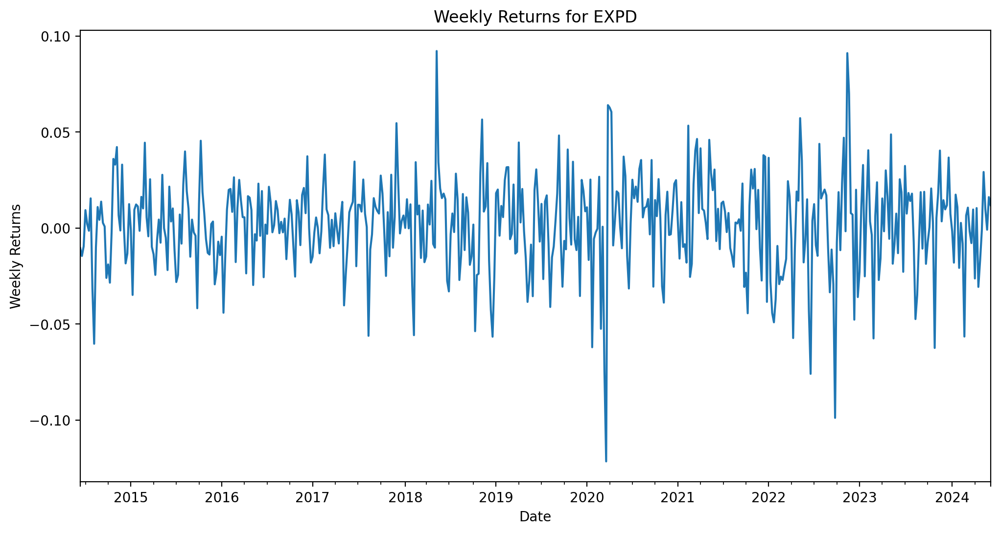

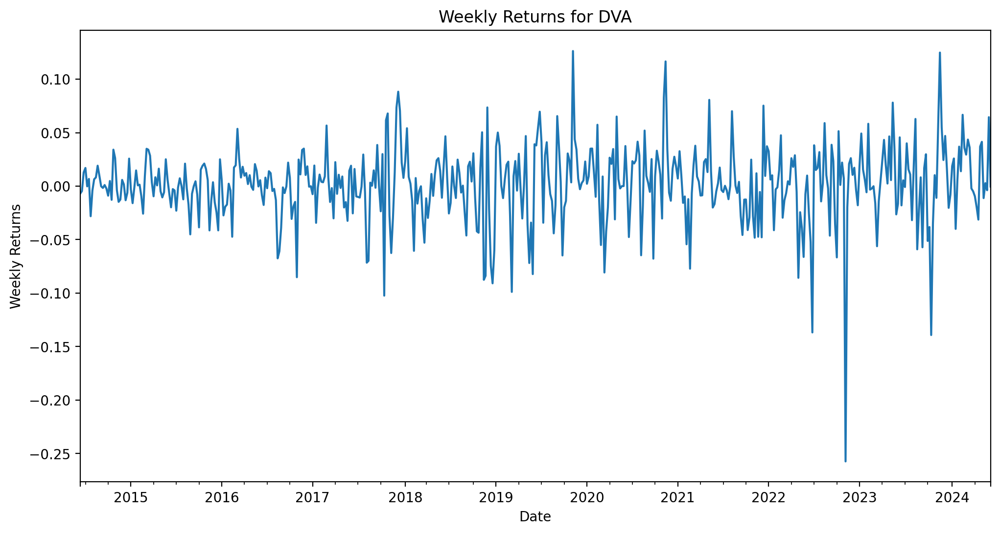

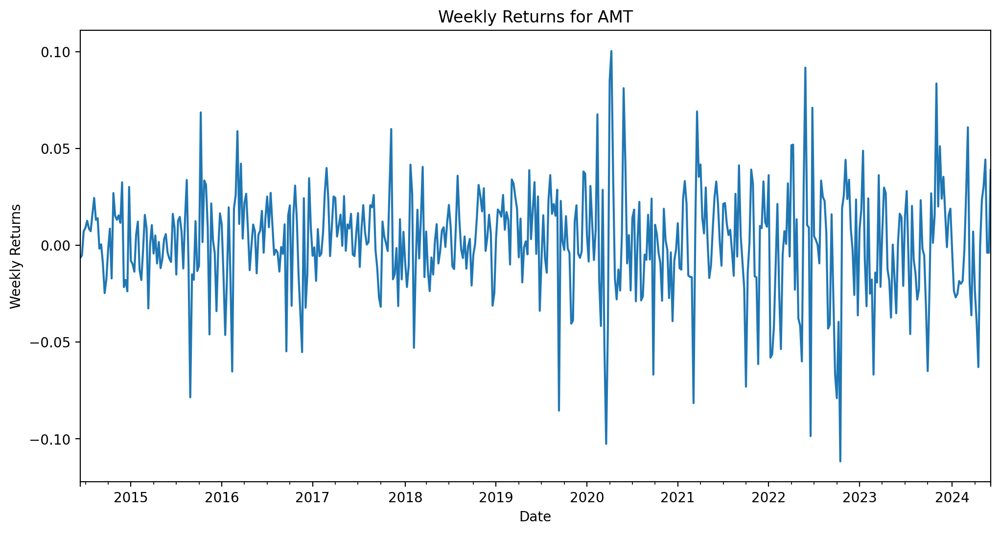

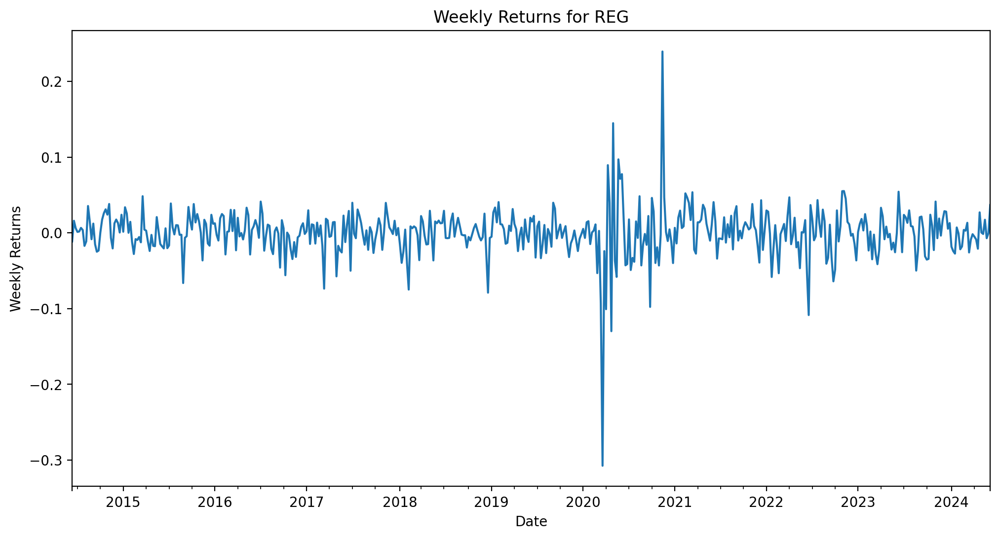

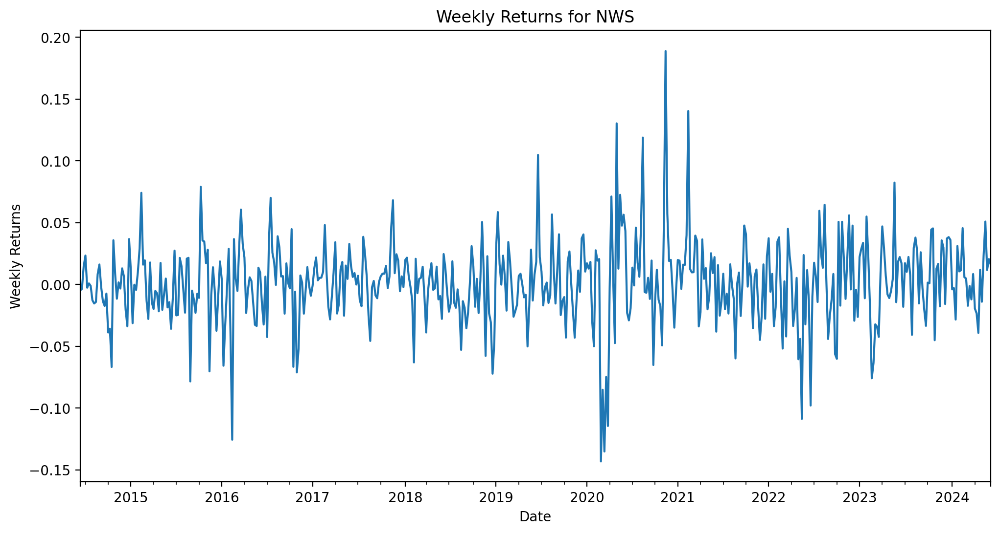

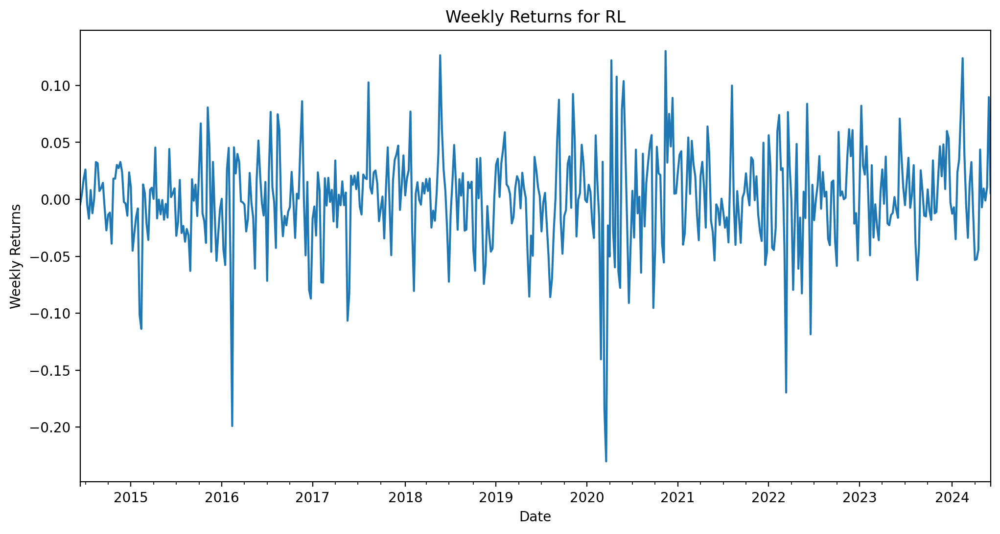

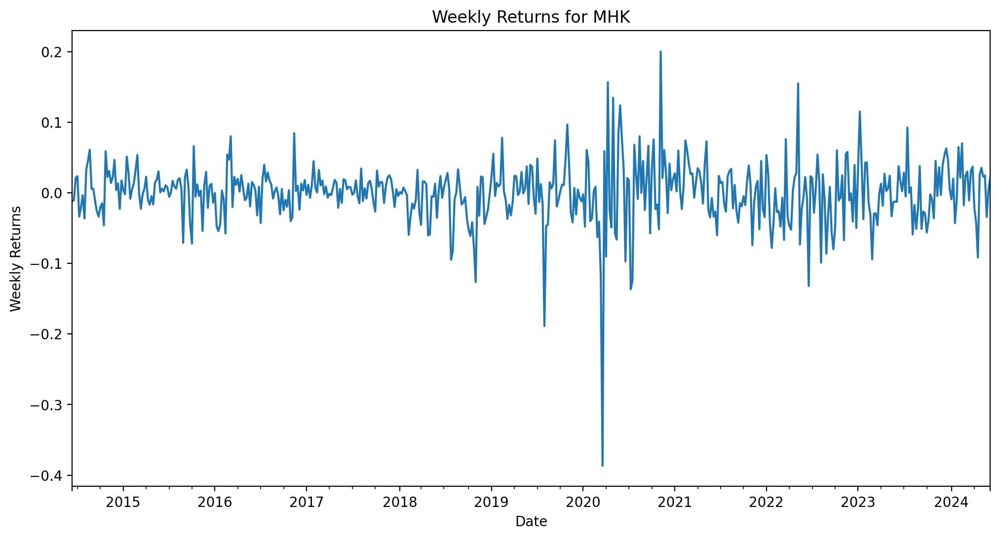

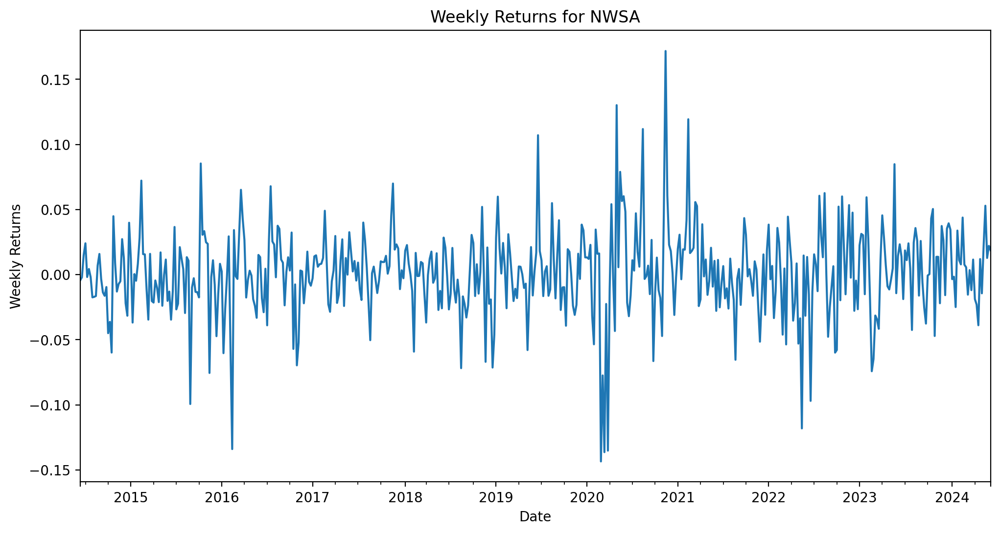

In [ ]:
import matplotlib.pyplot as plt

# Plot the weekly returns for each stock
for ticker, df_week in stock_dfs_week.items():
    df_week['weekly_ret'].plot(kind='line', figsize=(12, 6))
    plt.title(f'Weekly Returns for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Weekly Returns')
    plt.show()


In [ ]:
# Create a new dictionary to store modified DataFrames
udiff_dict = {}

# Iterate over each DataFrame in the original dictionary
for ticker, df_week in stock_dfs_week.items():
    # Drop the 'close' column from each DataFrame
    udiff = df_week.drop(['close'], axis=1)
    # Store the modified DataFrame in the new dictionary
    udiff_dict[ticker] = udiff

# Print the first 5 rows of each DataFrame in the udiff dictionary
for ticker, df_week in udiff_dict.items():
    print(f"First 5 rows of {ticker}:")
    print(df_week.head())
    print()


First 5 rows of EXPD:
            weekly_ret
Date                  
2014-06-15   -0.010393
2014-06-22   -0.014537
2014-06-29   -0.009523
2014-07-06    0.009332
2014-07-13    0.002121

First 5 rows of DVA:
            weekly_ret
Date                  
2014-06-15   -0.007010
2014-06-22   -0.004640
2014-06-29    0.012771
2014-07-06    0.016997
2014-07-13   -0.000192

First 5 rows of AMT:
            weekly_ret
Date                  
2014-06-15   -0.006549
2014-06-22   -0.005302
2014-06-29    0.007190
2014-07-06    0.009010
2014-07-13    0.012629

First 5 rows of REG:
            weekly_ret
Date                  
2014-06-15   -0.011347
2014-06-22    0.015999
2014-06-29    0.006242
2014-07-06    0.001283
2014-07-13    0.001823

First 5 rows of NWS:
            weekly_ret
Date                  
2014-06-15   -0.004773
2014-06-22   -0.003528
2014-06-29    0.014619
2014-07-06    0.023466
2014-07-13   -0.002555

First 5 rows of RL:
            weekly_ret
Date                  
2014-06-15   -0.00

##Test for Stationarity of the udiff series

Time series are stationary if they do not contain trends or seasonal swings. The Dickey-Fuller test can be used to test for stationarity

In [ ]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

In [ ]:
# Create empty dictionaries to store rolling mean and standard deviation DataFrames
rolmean_dict = {}
rolstd_dict = {}

# Iterate over each DataFrame in the udiff_dict dictionary
for ticker, df_week in udiff_dict.items():
    # Calculate rolling mean and standard deviation
    rolmean = df_week.rolling(20).mean()
    rolstd = df_week.rolling(20).std()

    # Store the rolling mean and standard deviation DataFrames in the respective dictionaries
    rolmean_dict[ticker] = rolmean
    rolstd_dict[ticker] = rolstd

# Now you have dictionaries containing rolling mean and standard deviation DataFrames for each stock


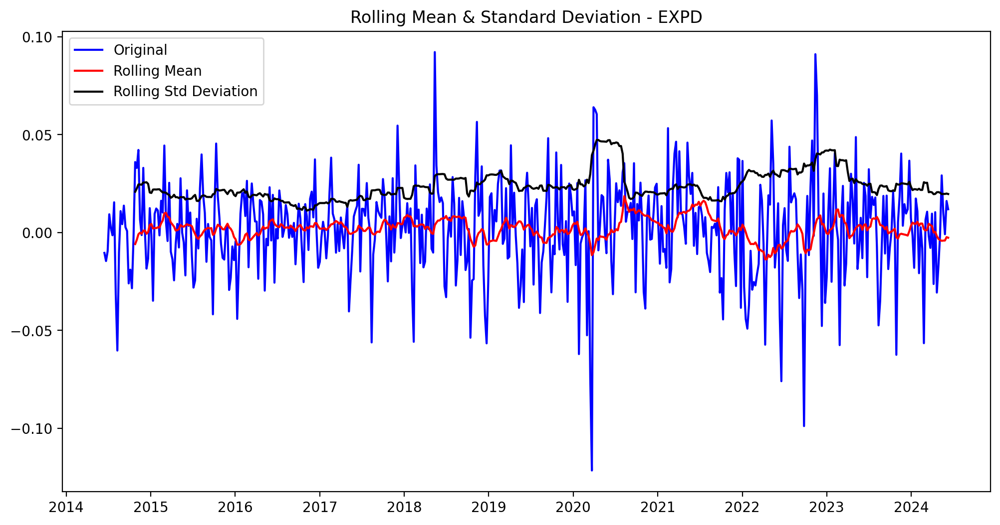

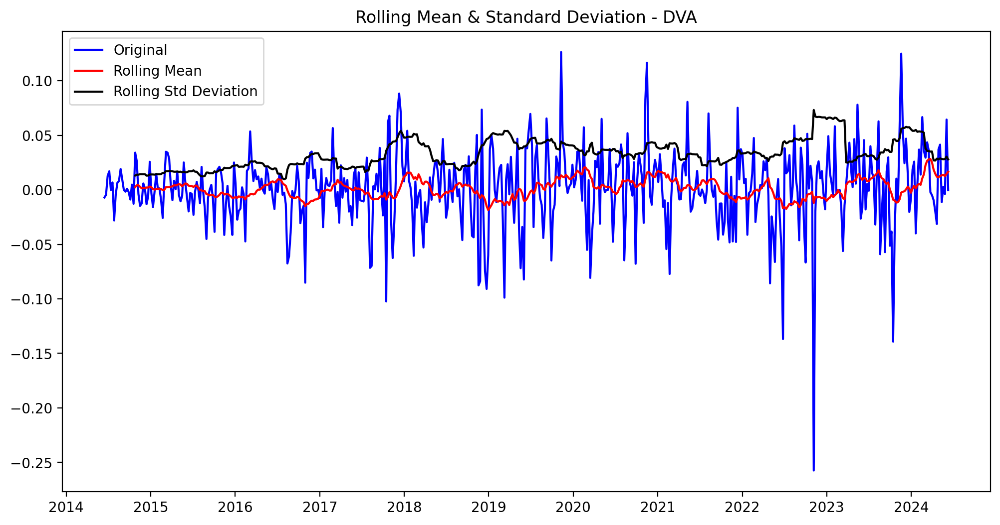

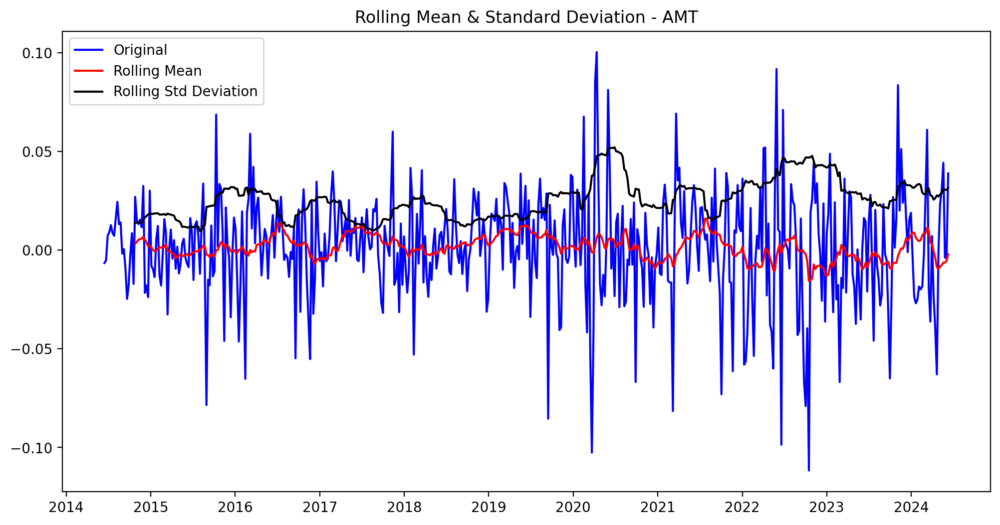

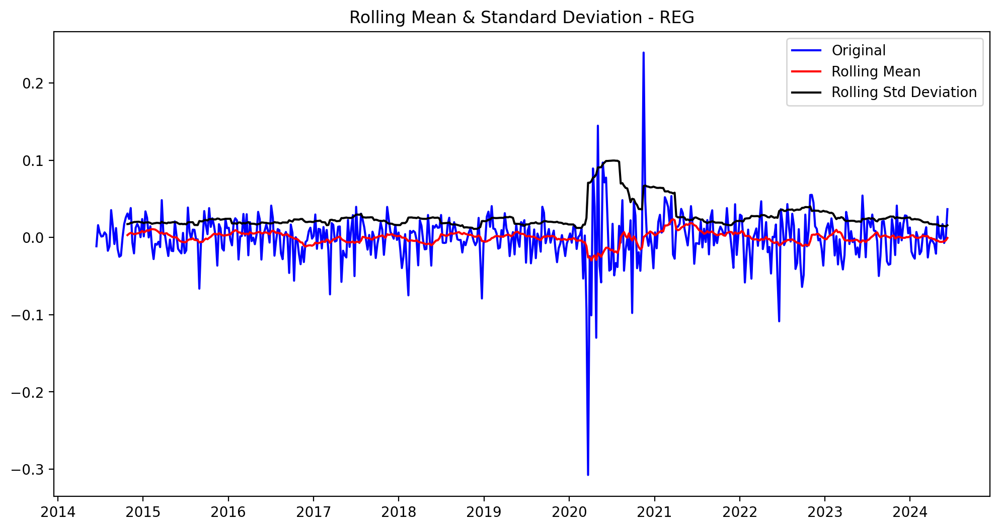

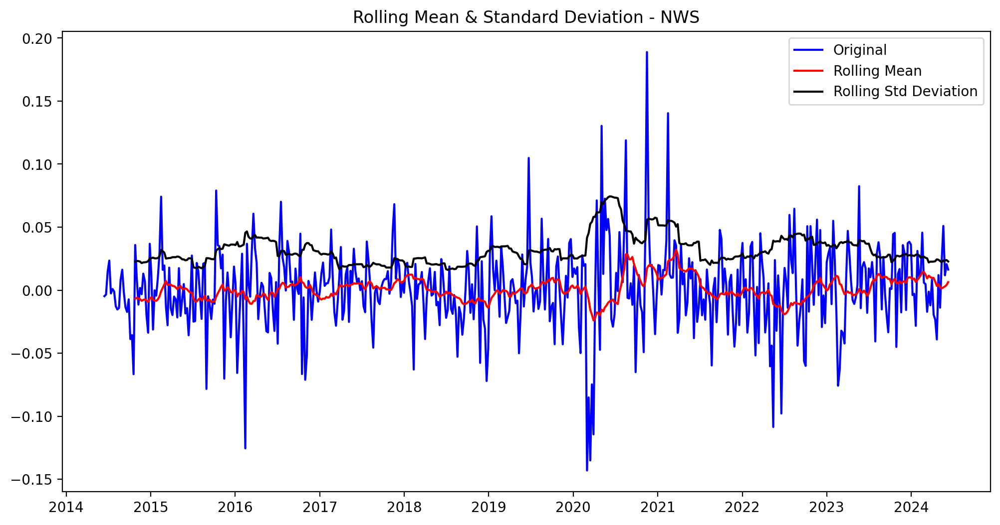

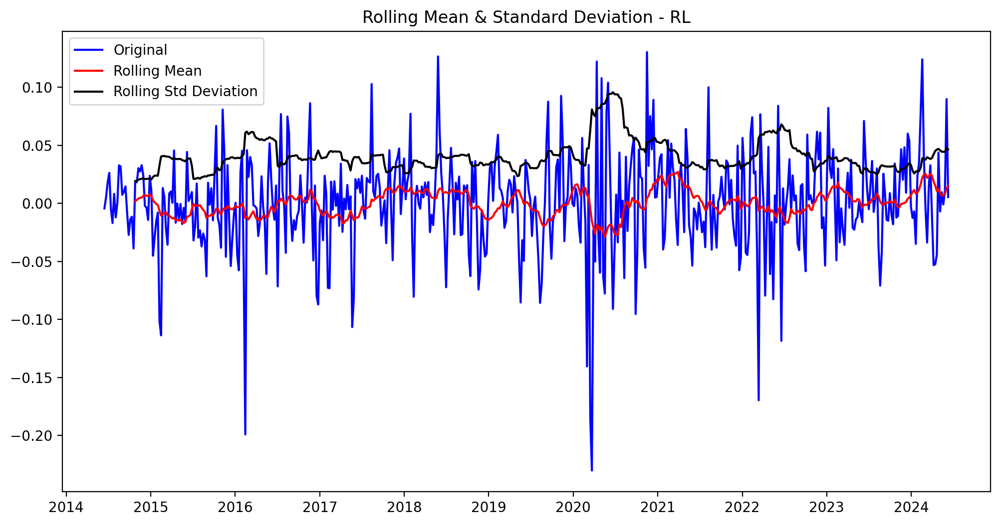

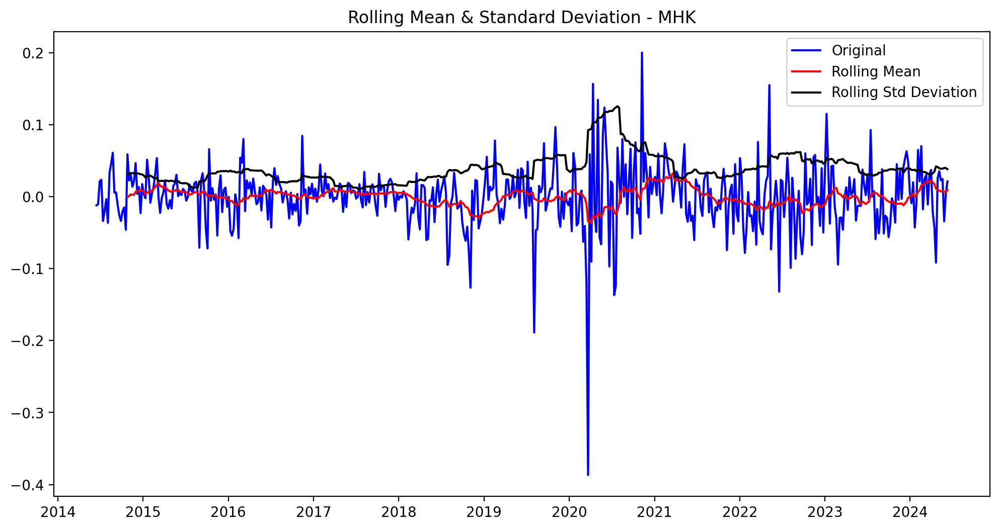

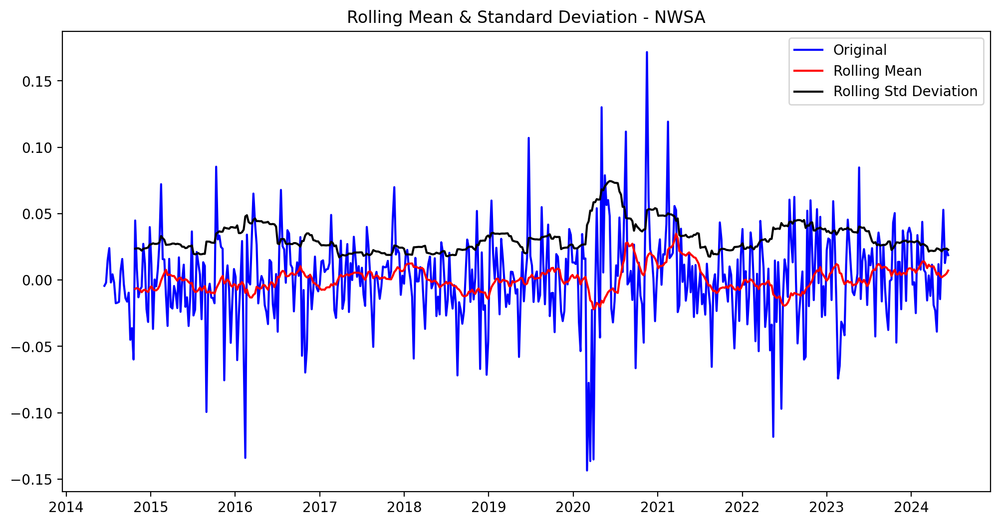

In [ ]:
import matplotlib.pyplot as plt

# Iterate over each DataFrame in the udiff_dict dictionary
for ticker, df_week in udiff_dict.items():
    # Retrieve the corresponding rolling mean and standard deviation DataFrames
    rolmean = rolmean_dict[ticker]
    rolstd = rolstd_dict[ticker]

    # Create a new figure
    plt.figure(figsize=(12, 6))

    # Plot the original data
    orig = plt.plot(df_week, color='blue', label='Original')

    # Plot the rolling mean
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')

    # Plot the rolling standard deviation
    std = plt.plot(rolstd, color='black', label='Rolling Std Deviation')

    # Set plot title and legend
    plt.title(f'Rolling Mean & Standard Deviation - {ticker}')
    plt.legend(loc='best')

    # Show the plot
    plt.show()


In [ ]:
# Create an empty list to store result Series
result_list = []

# Iterate over each DataFrame in the udiff_dict dictionary
for ticker, df_week in udiff_dict.items():
    # Perform Dickey-Fuller test
    dftest = adfuller(df_week['weekly_ret'], autolag='AIC')

    # Create a Series with the results
    result_series = pd.Series({
        'Ticker': ticker,
        'Test Statistic': dftest[0],
        'p-value': dftest[1],
        '#Lags Used': dftest[2],
        'Number of Observations Used': dftest[3],
        'Critical Value (1%)': dftest[4]['1%'],
        'Critical Value (5%)': dftest[4]['5%'],
        'Critical Value (10%)': dftest[4]['10%']
    })

    # Append the result Series to the list
    result_list.append(result_series)

# Concatenate the list of Series into a DataFrame
df_results = pd.concat(result_list, axis=1).T.reset_index(drop=True)

# Print the results DataFrame
print(df_results)


  Ticker Test Statistic p-value #Lags Used Number of Observations Used  \
0   EXPD     -10.985598     0.0          5                         516   
1    DVA     -15.368257     0.0          1                         520   
2    AMT     -11.314565     0.0          5                         516   
3    REG     -10.318851     0.0          5                         516   
4    NWS     -17.424115     0.0          0                         521   
5     RL     -16.144488     0.0          1                         520   
6    MHK      -7.945429     0.0          6                         515   
7   NWSA     -17.679641     0.0          0                         521   

  Critical Value (1%) Critical Value (5%) Critical Value (10%)  
0           -3.443087           -2.867158            -2.569762  
1           -3.442988           -2.867114            -2.569739  
2           -3.443087           -2.867158            -2.569762  
3           -3.443087           -2.867158            -2.569762  
4       

In [ ]:
# Filter the DataFrame to include only rows where p-value is less than 0.05
significant_results = df_results[df_results['p-value'] < 0.05]

# Extract the tickers from the filtered DataFrame
significant_tickers = significant_results['Ticker'].tolist()

# Print the significant tickers
print("Significant Tickers with p-value < 0.05:")
print(significant_tickers)
print("We have", len(significant_tickers),  "stocks where the conditions are satisfied for stationarity")


Significant Tickers with p-value < 0.05:
['EXPD', 'DVA', 'AMT', 'REG', 'NWS', 'RL', 'MHK', 'NWSA']
We have 8 stocks where the conditions are satisfied for stationarity


With a p-value < 0.05, we can reject the null hypotehsis. This data set is stationary.

In [ ]:
# Create a new dictionary to store udiff DataFrames for significant stocks
udiff_significant = {}

# Iterate over each significant ticker
for ticker in significant_tickers:
    # Check if the ticker exists in udiff_dict
    if ticker in udiff_dict:
        # If yes, add the DataFrame to the new dictionary
        udiff_significant[ticker] = udiff_dict[ticker]

# Print the number of significant stocks
print("Number of significant stocks:", len(udiff_significant))


Number of significant stocks: 8


##ACF and PACF Charts
Making autocorrelation and partial autocorrelation charts help us choose hyperparameters for the ARIMA model.

The ACF gives us a measure of how much each "y" value is correlated to the previous n "y" values prior.

The PACF is the partial correlation function gives us (a sample of) the amount of correlation between two "y" values separated by n lags excluding the impact of all the "y" values in between them.

**Autocorrelation Function (ACF):**

Imagine you have a time series dataset, like stock prices over time.
The ACF measures how much each value in the dataset is related to its previous values at different time lags.
For example, if the ACF value is high at lag 1, it means that each value in the dataset is highly correlated with the value that came just before it (one time period ago). Similarly, if the ACF value is high at lag 2, it means that each value is highly correlated with the value two time periods ago, and so on.

**Partial Autocorrelation Function (PACF):**

The PACF, on the other hand, measures the correlation between two specific values in the dataset while removing the effect of all the other values in between them.
For example, if we're looking at the PACF at lag 3, it measures the correlation between a value three time periods ago and the current value, while removing the influence of all the values in between.
It helps us understand the direct relationship between specific values at different time lags, without the indirect influence of other values.
In simpler terms, both ACF and PACF help us understand how each value in a time series dataset is related to other values at different points in time. A high value in either ACF or PACF at a particular lag suggests a strong relationship between values separated by that lag. These charts are essential for choosing the right parameters for time series models like ARIMA, as they give insights into the underlying patterns in the data.

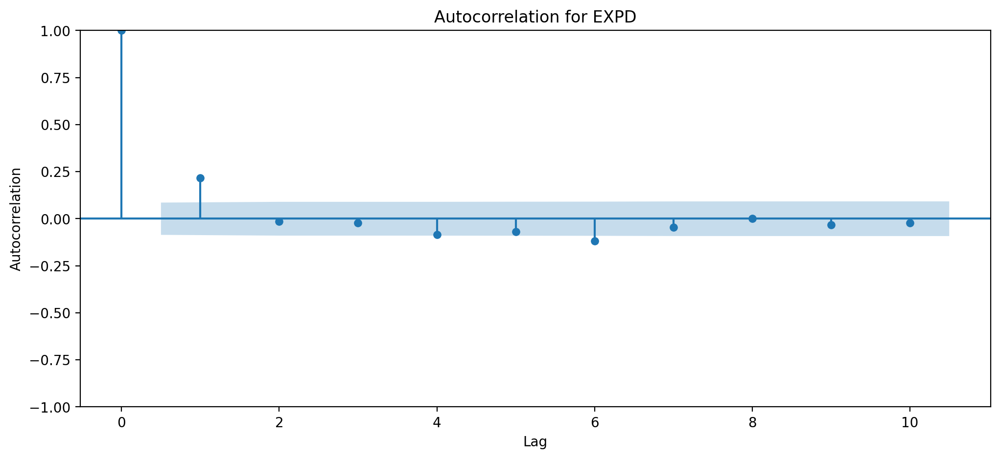

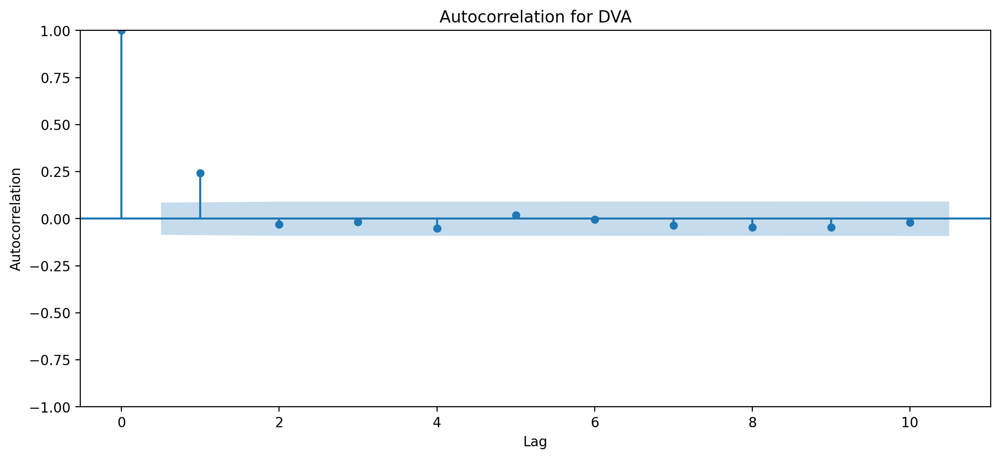

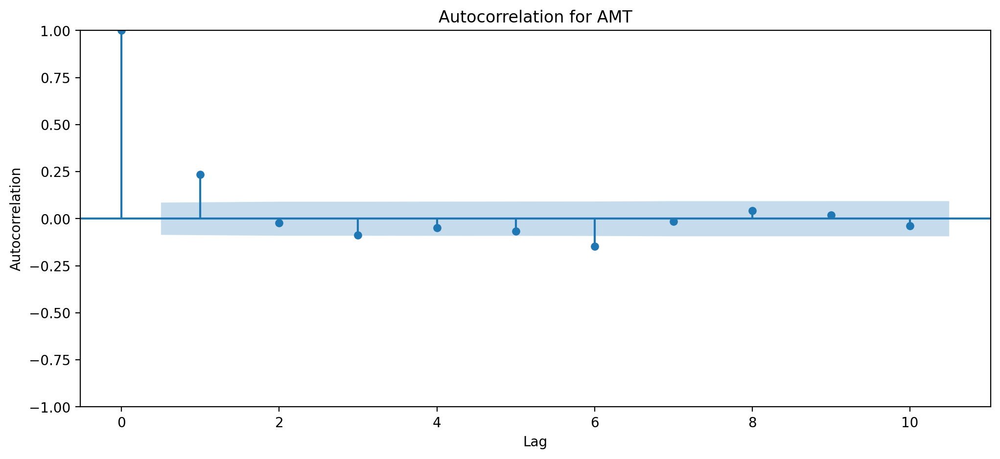

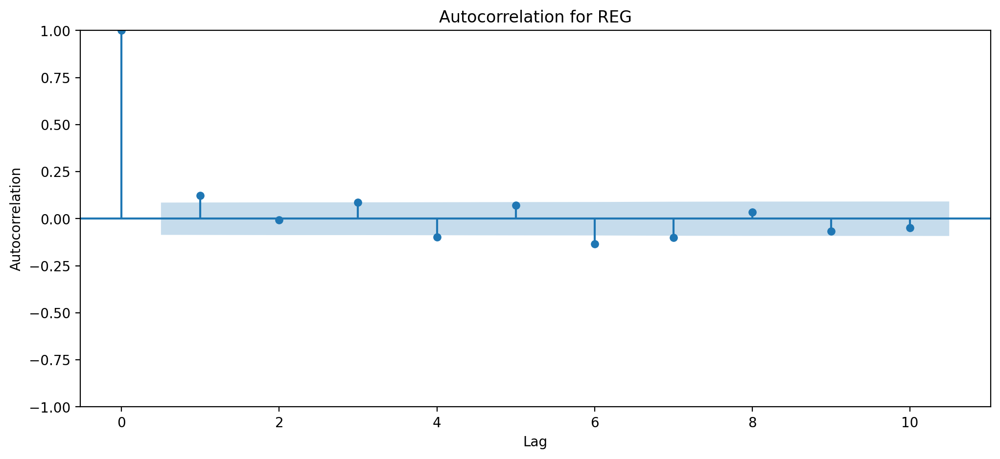

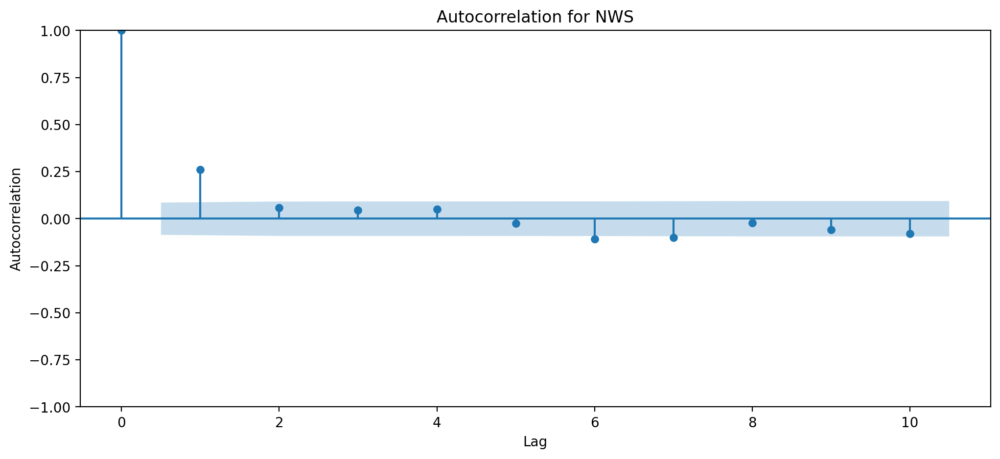

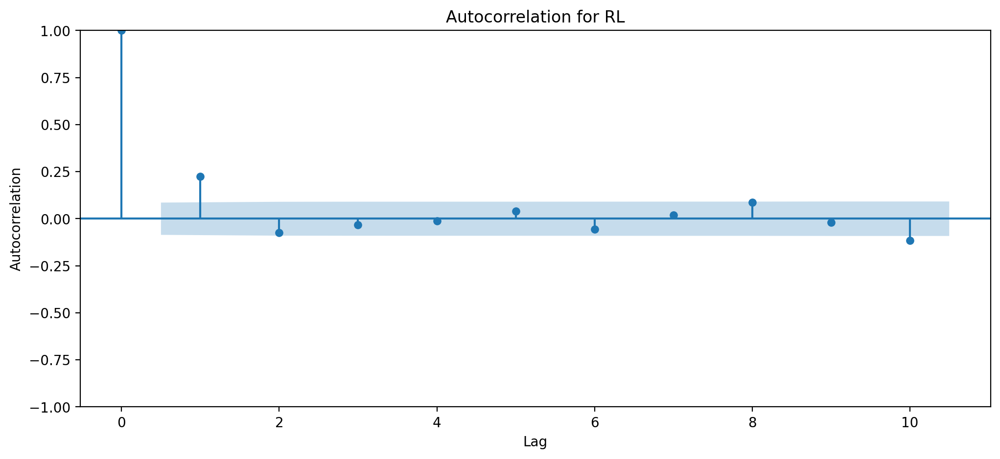

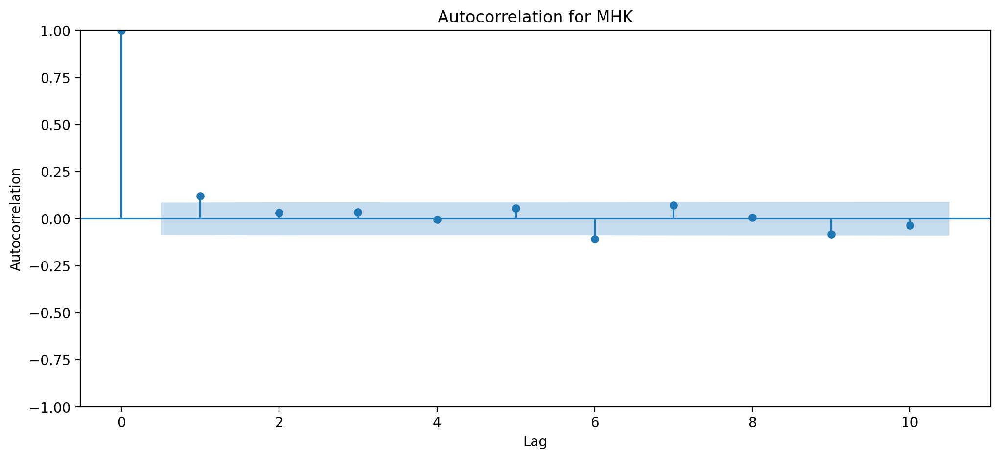

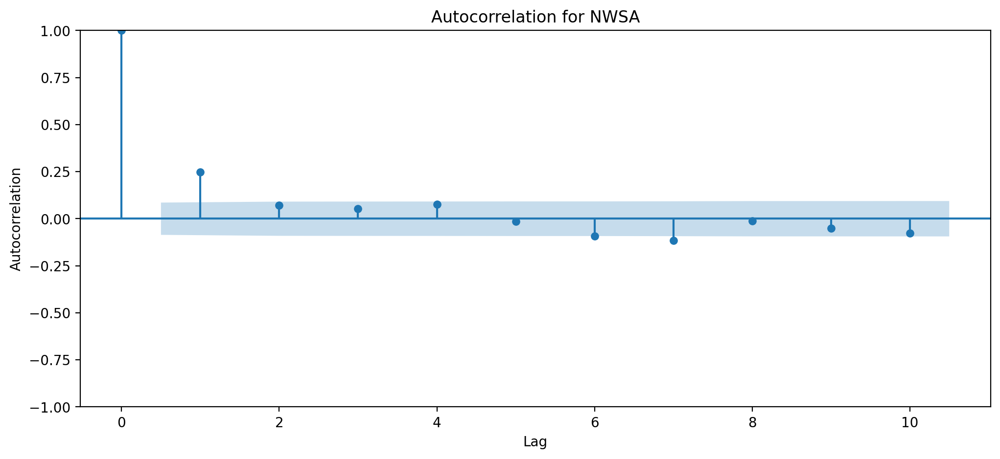

In [ ]:
#ACF ~ q
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

# Plot autocorrelation charts for each stock in udiff_significant
for ticker, df_week in udiff_significant.items():
    fig, ax = plt.subplots(figsize=(12, 5))
    plot_acf(df_week['weekly_ret'], lags=10, ax=ax)
    plt.title(f'Autocorrelation for {ticker}')
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.show()


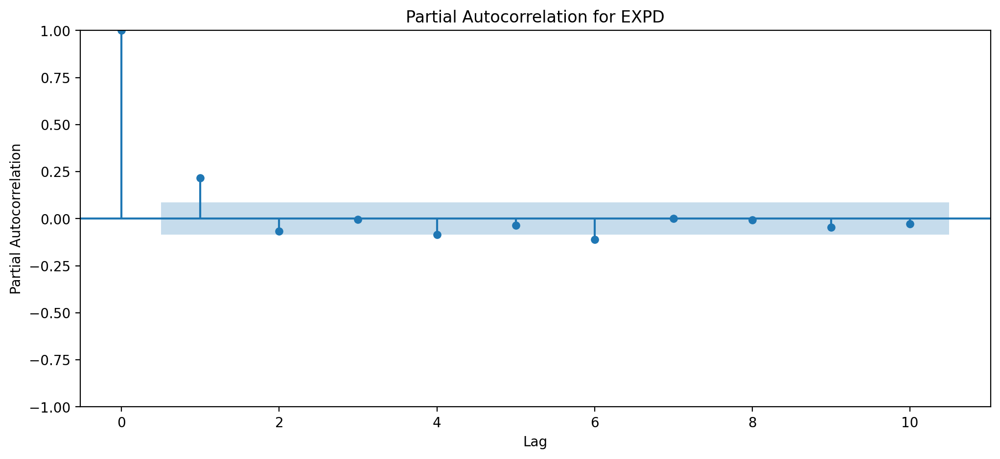

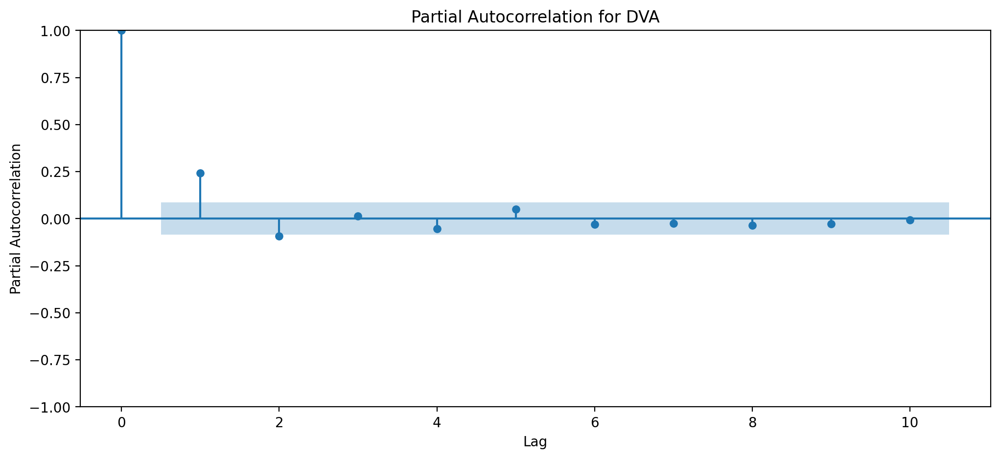

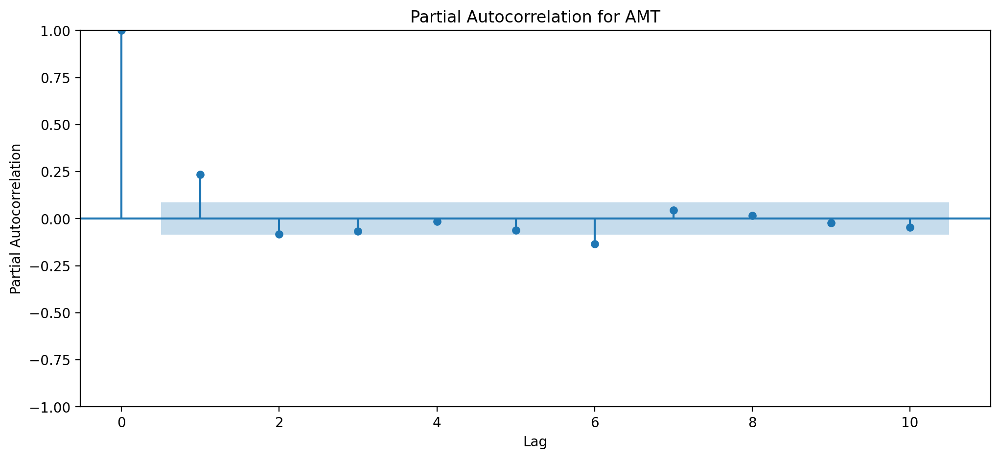

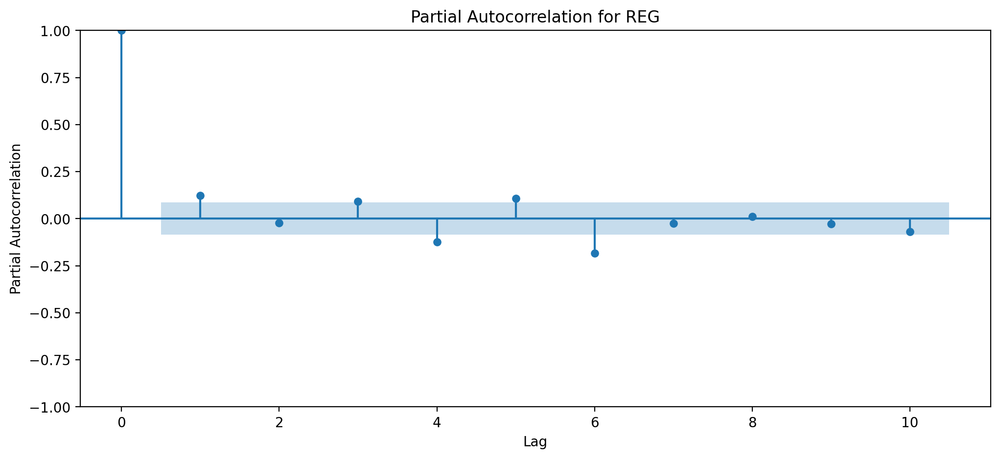

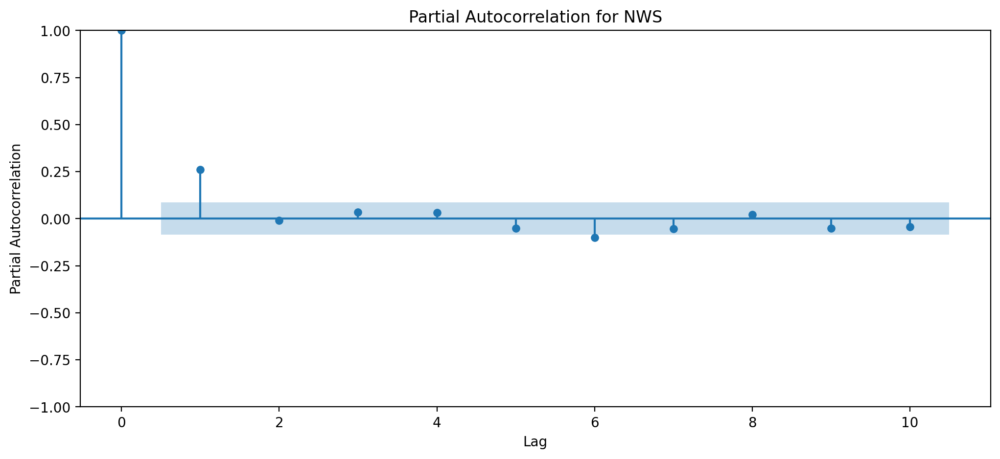

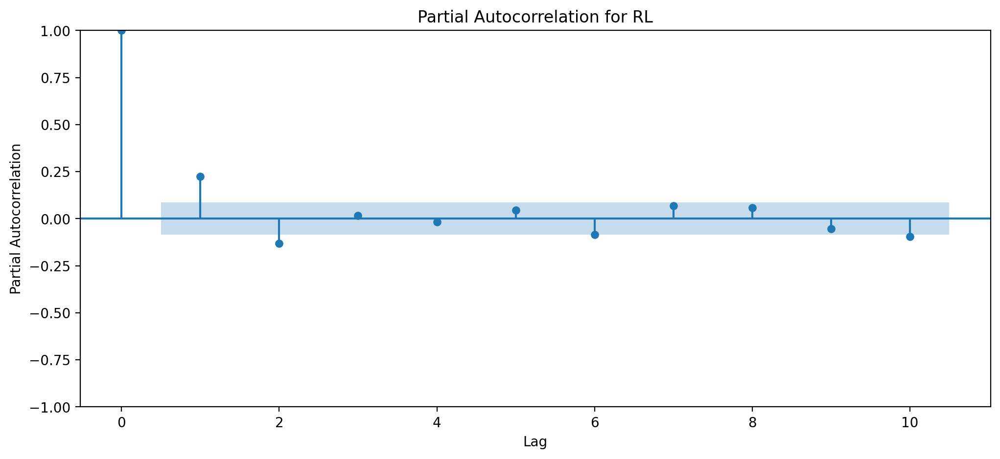

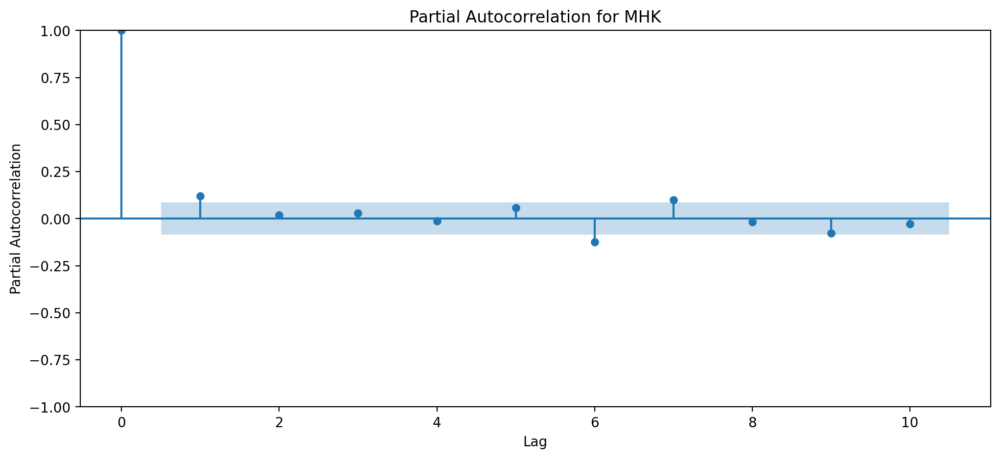

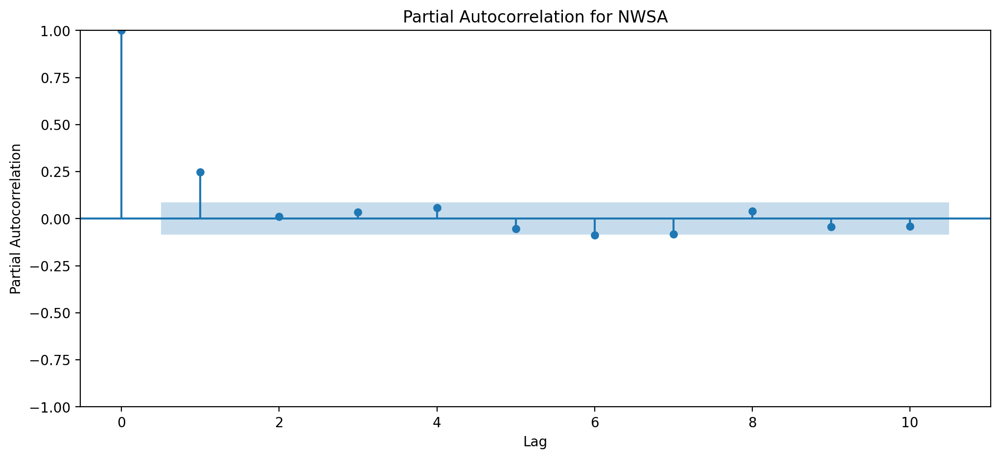

In [ ]:
#PACF ~ p
from statsmodels.graphics.tsaplots import plot_pacf
import matplotlib.pyplot as plt

# Plot partial autocorrelation charts for each stock in udiff_significant
for ticker, df_week in udiff_significant.items():
    fig, ax = plt.subplots(figsize=(12, 5))
    plot_pacf(df_week['weekly_ret'], lags=10, ax=ax)
    plt.title(f'Partial Autocorrelation for {ticker}')
    plt.xlabel('Lag')
    plt.ylabel('Partial Autocorrelation')
    plt.show()


##Building ARIMA Model
Since we differenced the weekly closing prices, we technically only need to build an ARMA model. The data has already been integrated and is stationary.

Let's Use Statsmodel's ARMA with those parameters to build a model.
The way to evaluate the model is to look at AIC - see if it reduces or increases.
The lower the AIC (i.e. the more negative it is), the better the model.

###Finding Optimal Parameters

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import itertools

# Define the range of p and q values to search over
p_values = range(4)  # Adjust the range as needed
q_values = range(4)  # Adjust the range as needed

# Perform grid search for each stock in udiff_significant
optimal_params = {}
for ticker, df_week in udiff_significant.items():
    min_aic = float('inf')
    best_params = None

    # Iterate over all combinations of p and q values
    for p, q in itertools.product(p_values, q_values):
        try:
            # Fit ARIMA model
            model = ARIMA(df_week['weekly_ret'], order=(p, 0, q))  # Use (p, d, q) for non-stationary data
            results = model.fit()

            # Check if AIC is lower than the current minimum
            if results.aic < min_aic:
                min_aic = results.aic
                best_params = (p, q)
        except:
            continue

    # Store the optimal parameters for the current stock
    optimal_params[ticker] = best_params

# Print the optimal parameters for each stock
for ticker, params in optimal_params.items():
    print(f"Optimal parameters for {ticker}: p={params[0]}, q={params[1]}")


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels

Optimal parameters for EXPD: p=0, q=1
Optimal parameters for DVA: p=0, q=1
Optimal parameters for AMT: p=2, q=1
Optimal parameters for REG: p=3, q=1
Optimal parameters for NWS: p=1, q=0
Optimal parameters for RL: p=1, q=3
Optimal parameters for MHK: p=1, q=0
Optimal parameters for NWSA: p=1, q=0


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


###Model Summaries

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Create an empty dictionary to store the ARIMA model summaries
arima_summaries = {}

# Iterate over each stock in udiff_significant
for ticker, df_week in udiff_significant.items():
    try:
        # Get the optimal parameters for the current stock
        p, q = optimal_params[ticker]

        # Fit ARIMA model with optimal parameters
        arima_model = ARIMA(df_week['weekly_ret'], order=(p, 0, q)).fit()

        # Store the summary in the dictionary
        arima_summaries[ticker] = arima_model.summary()
    except:
        # Handle any exceptions that occur during fitting
        arima_summaries[ticker] = "Model fitting failed"

# Print the summaries
for ticker, summary in arima_summaries.items():
    print(f"Summary for {ticker}:")
    print(summary)
    print()


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Summary for EXPD:
                               SARIMAX Results                                
Dep. Variable:             weekly_ret   No. Observations:                  522
Model:                 ARIMA(0, 0, 1)   Log Likelihood                1208.406
Date:                Mon, 03 Jun 2024   AIC                          -2410.812
Time:                        19:11:47   BIC                          -2398.039
Sample:                    06-15-2014   HQIC                         -2405.809
                         - 06-09-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0019      0.001      1.413      0.158      -0.001       0.004
ma.L1          0.2312      0.032      7.215      0.000       0.168       0.294
sigma2         0.0006   2.58e-05  

###Plotting Actual and Fitted values

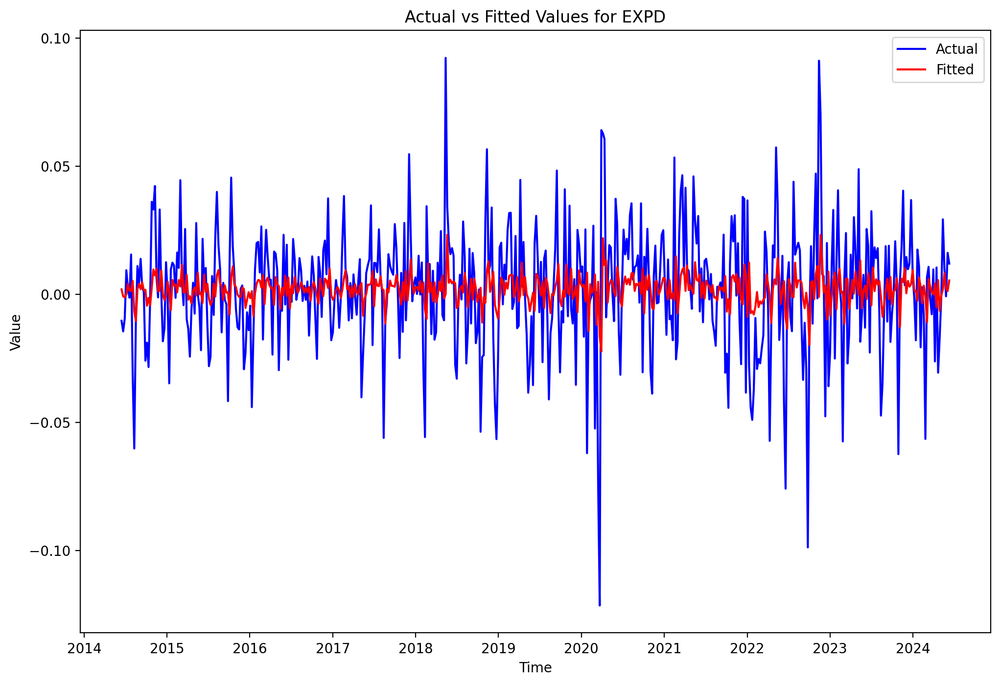

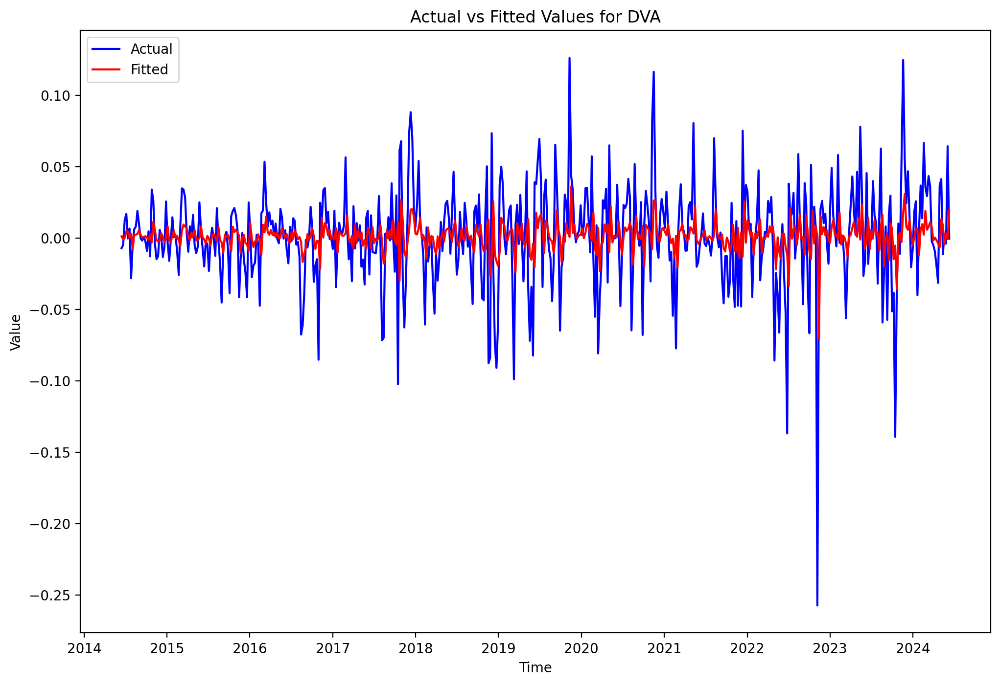

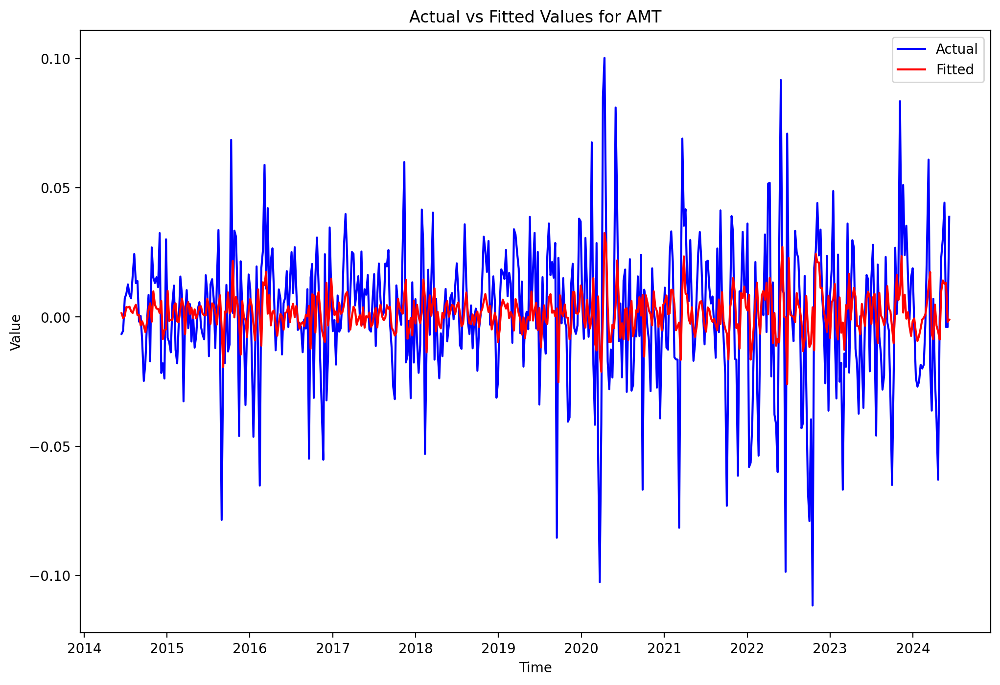

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


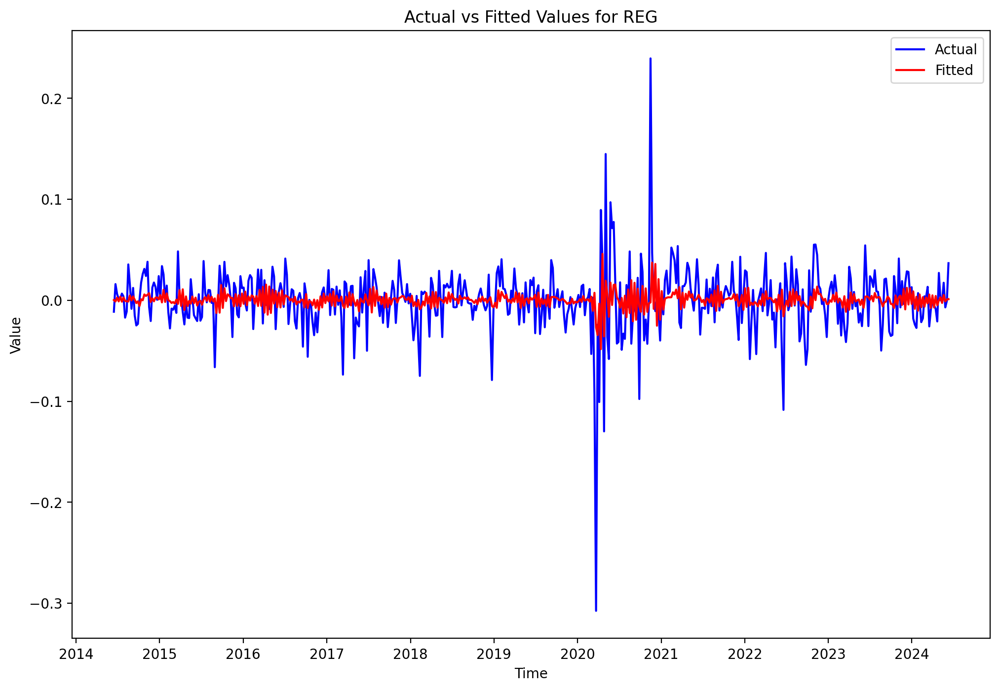

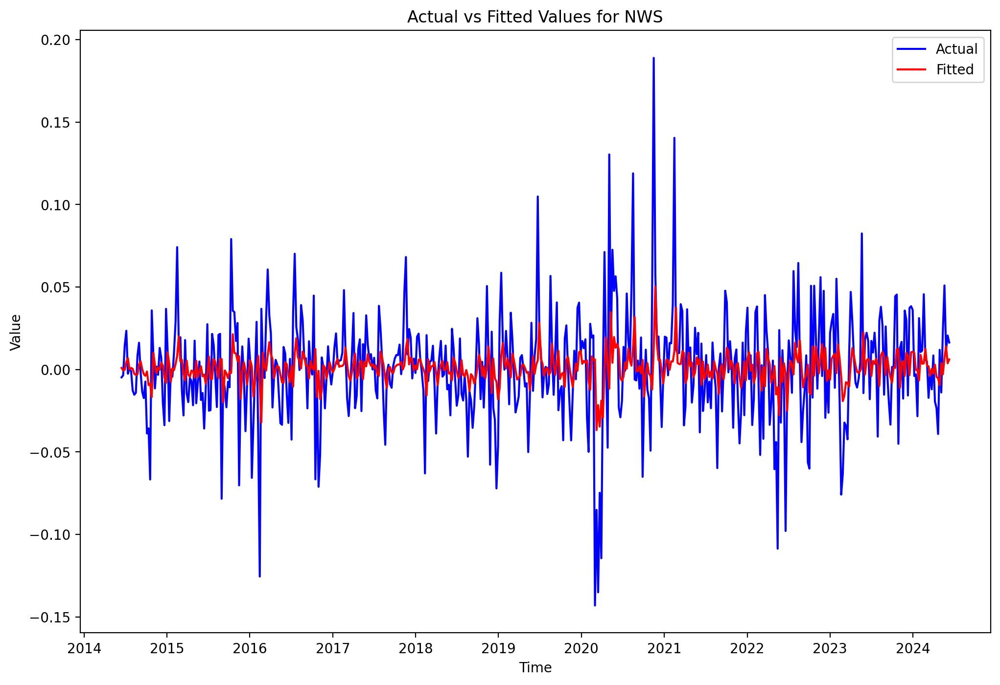

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


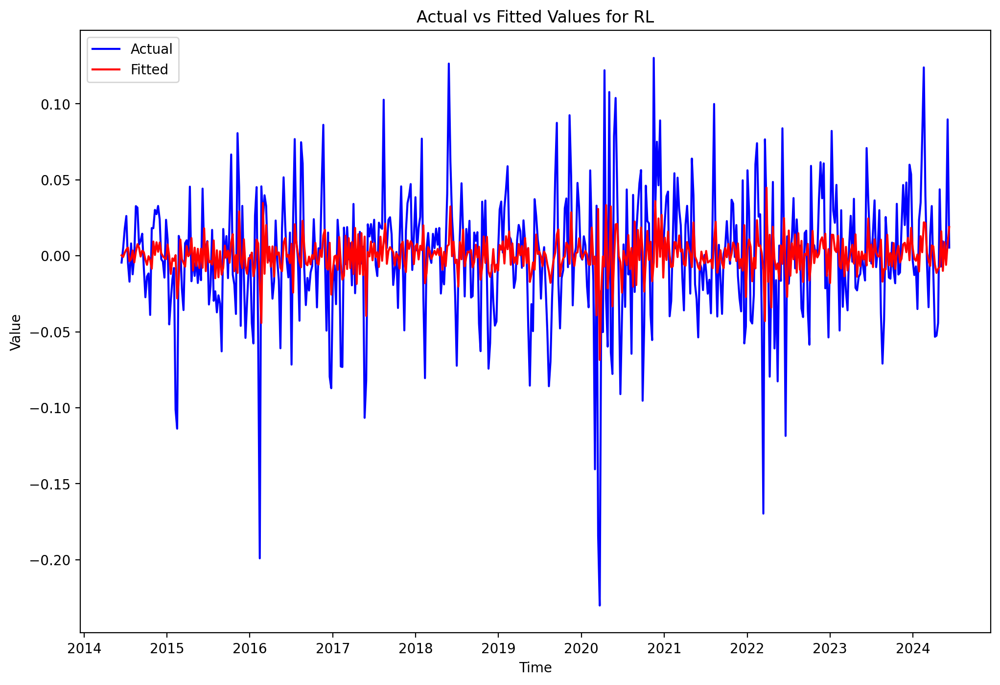

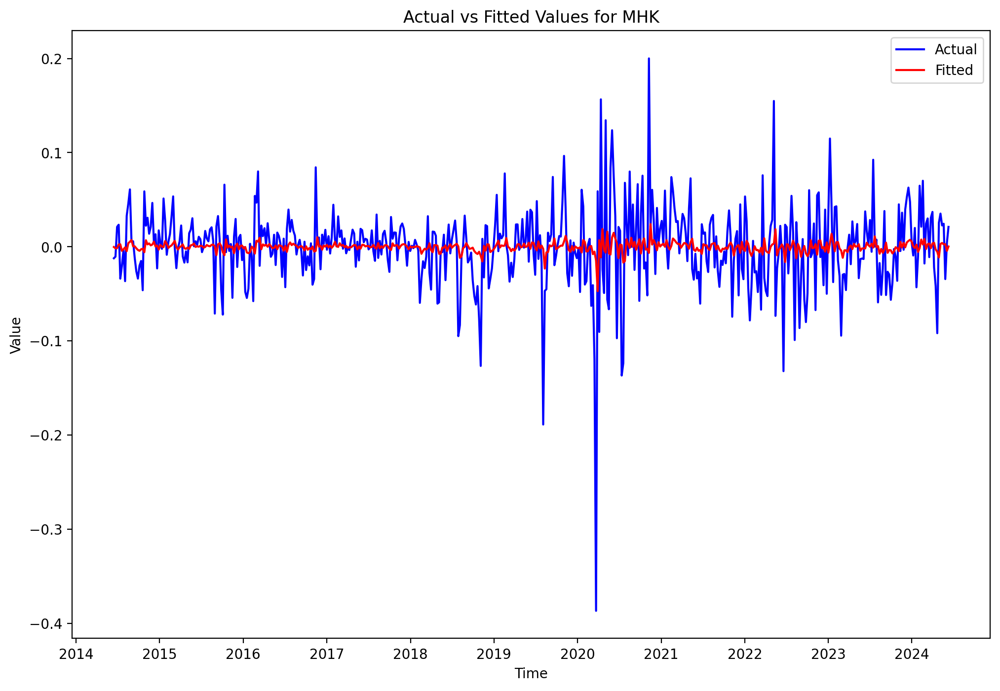

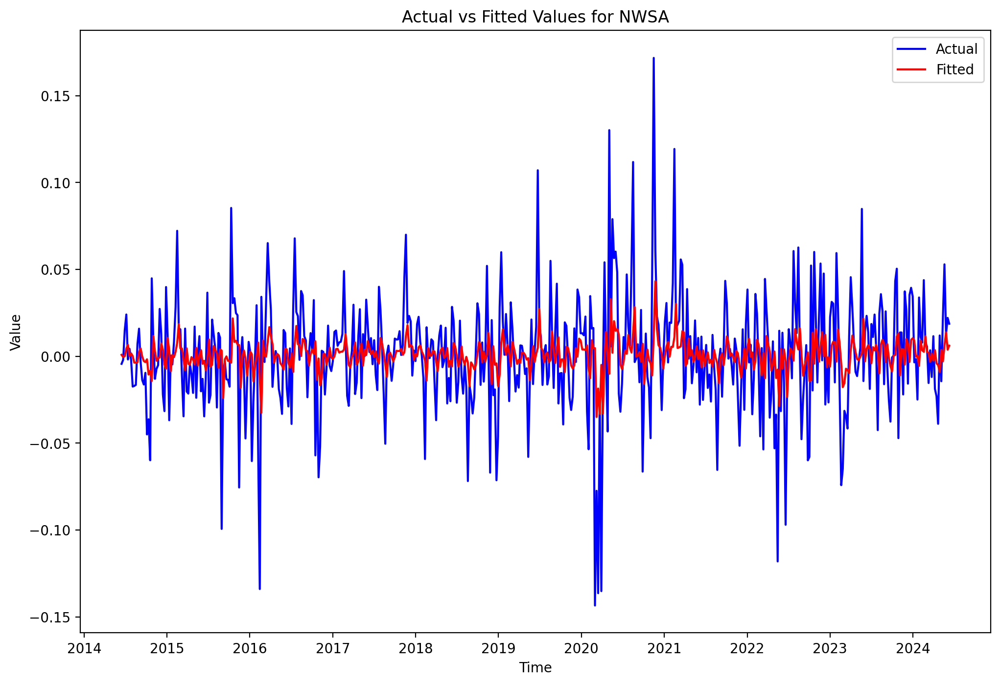

In [ ]:
# Iterate over each stock in udiff_significant
for ticker, df_week in udiff_significant.items():
    plt.figure(figsize=(12, 8))
    try:
        # Get the optimal parameters for the current stock
        p, q = optimal_params[ticker]

        # Fit ARIMA model with optimal parameters
        arima_model = ARIMA(df_week['weekly_ret'], order=(p, 0, q)).fit()

        # Plot actual values
        plt.plot(df_week['weekly_ret'], color='blue', label='Actual')

        # Plot fitted values
        plt.plot(arima_model.fittedvalues, color='red', label='Fitted')

        # Set title and labels
        plt.title(f'Actual vs Fitted Values for {ticker}')
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.legend()
        plt.show()
    except:
        # Handle any exceptions that occur during fitting
        print(f"Failed to plot for {ticker}")


###Forecasting 4 weeks ahead

Let's make a forecast 4 weeks ahead:

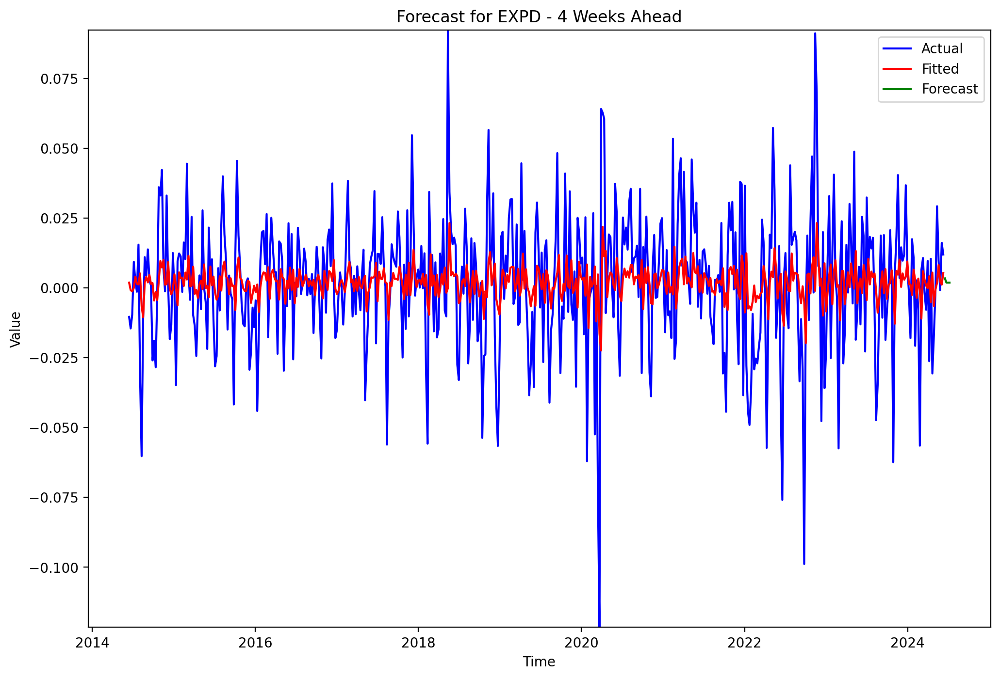

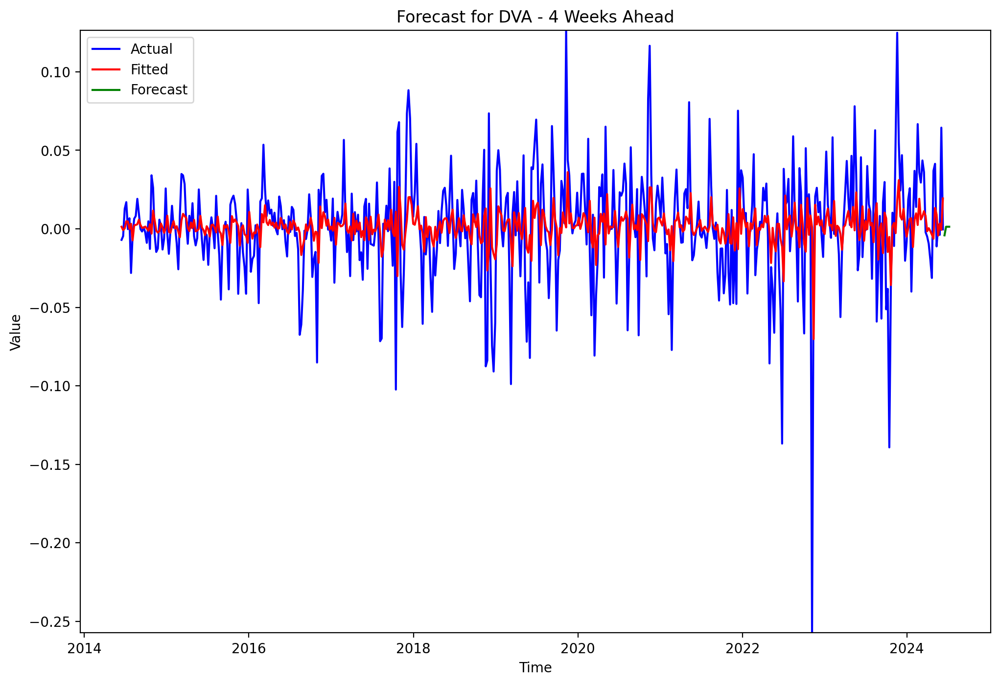

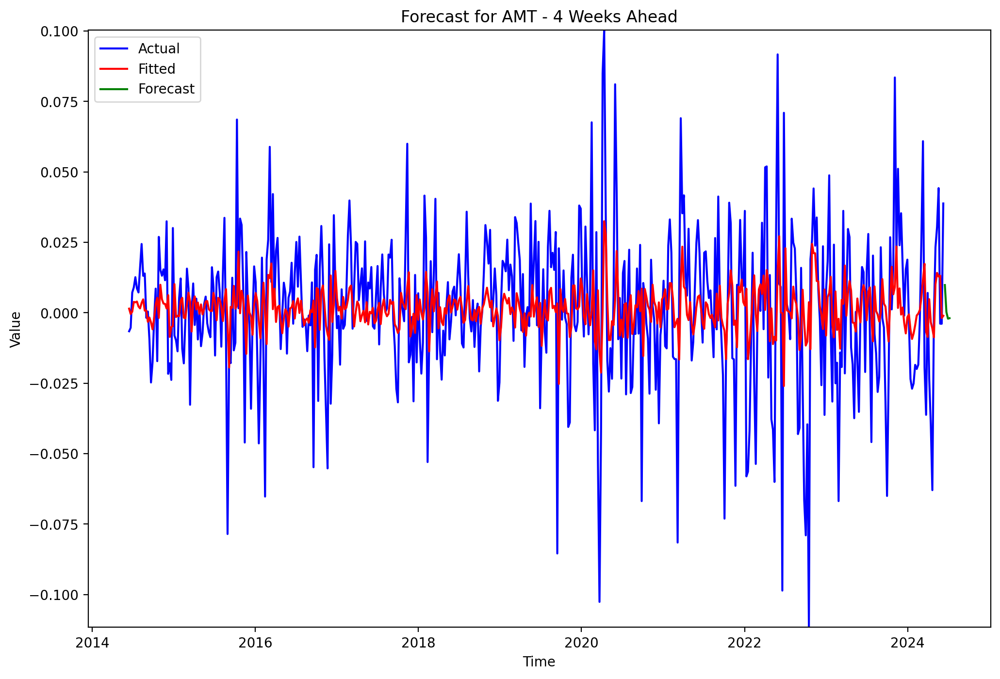

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


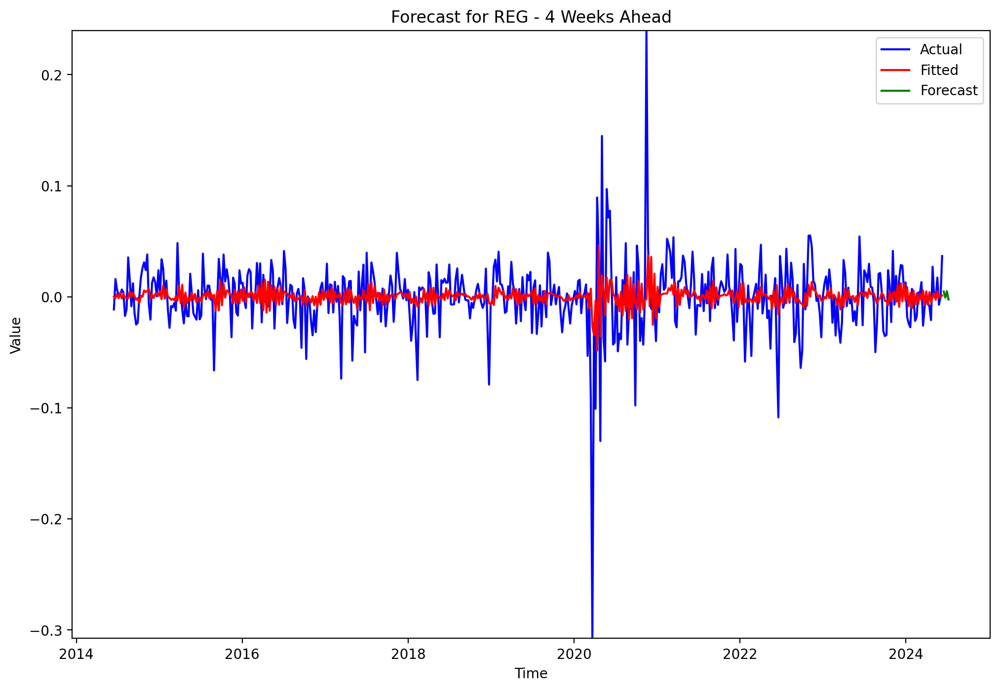

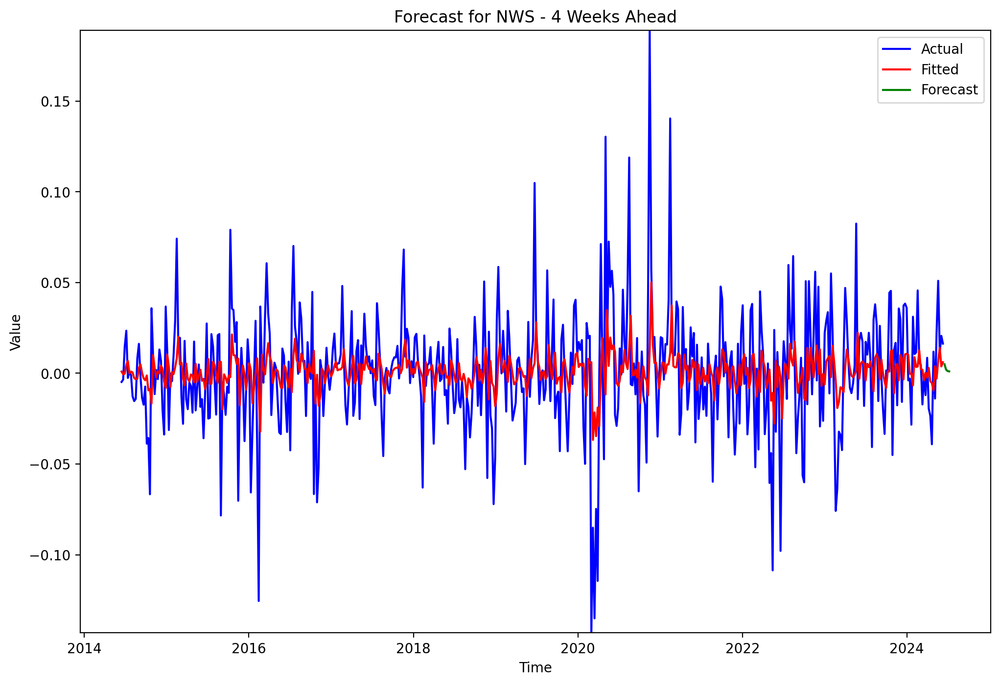

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


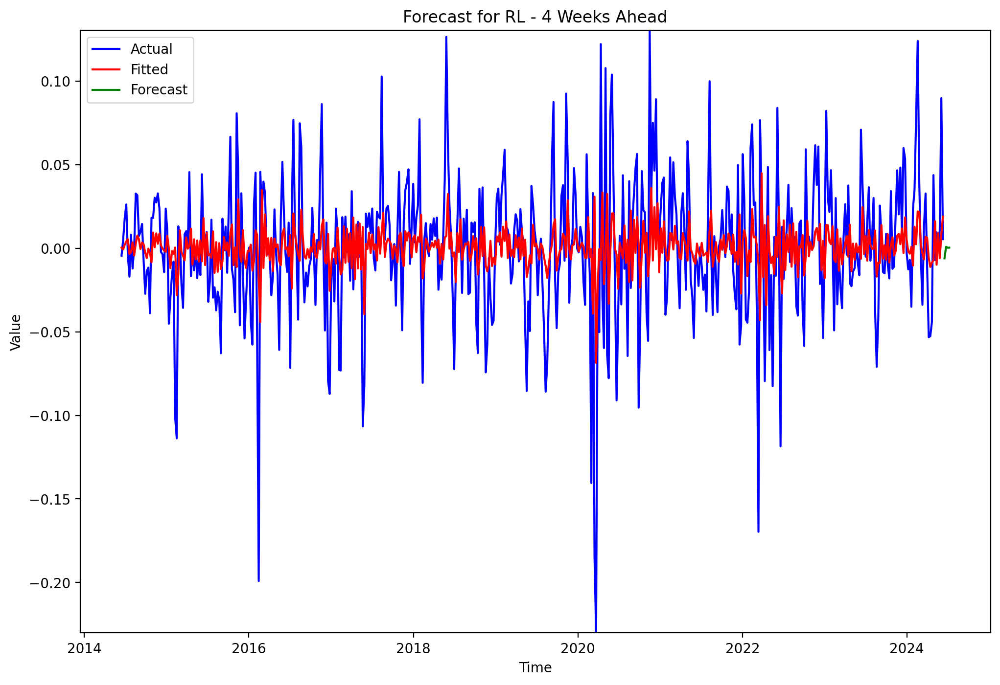

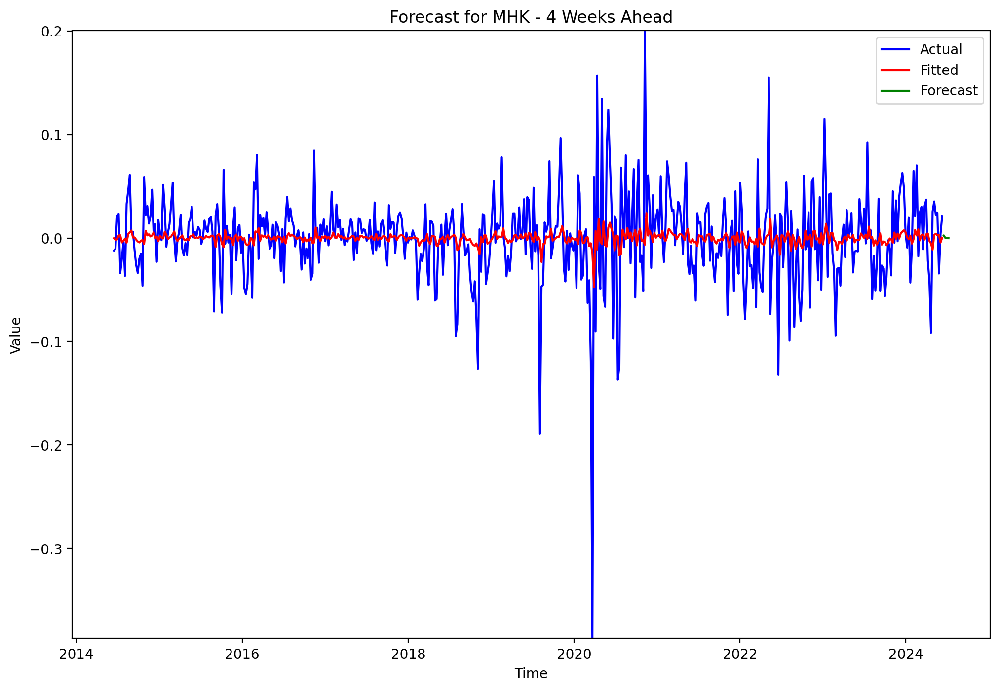

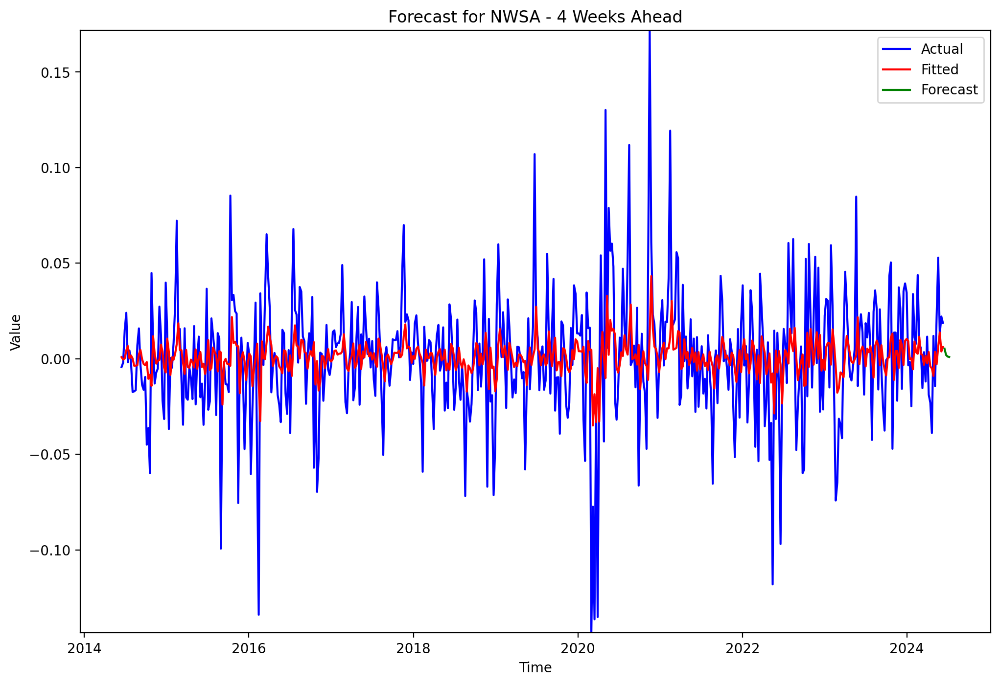

In [ ]:
# Iterate over each stock in udiff_significant to generate forecasts and plot individually
steps = 4
for ticker, df_week in udiff_significant.items():
    try:
        # Get the optimal parameters for the current stock
        p, q = optimal_params[ticker]

        # Fit ARIMA model with optimal parameters
        arima_model = ARIMA(df_week['weekly_ret'], order=(p, 0, q)).fit()

        # Make the forecast
        forecast = arima_model.forecast(steps=steps)

        # Plot the forecast
        plt.figure(figsize=(12, 8))

        # Plot the actual weekly returns
        plt.plot(df_week.index, df_week['weekly_ret'], color='blue', label='Actual')

        # Plot the fitted values
        plt.plot(df_week.index, arima_model.fittedvalues, color='red', label='Fitted')

        # Plot the forecasted values
        plt.plot(pd.date_range(start=df_week.index[-1], periods=steps + 1, freq='W')[1:], forecast, color='green')

        # Set the y-axis limits to include the forecasted values
        plt.ylim(min(df_week['weekly_ret'].min(), forecast.min()), max(df_week['weekly_ret'].max(), forecast.max()))

        # Set the title and labels
        plt.title(f'Forecast for {ticker} - 4 Weeks Ahead')
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.legend(['Actual', 'Fitted', 'Forecast'])
        plt.show()

    except:
        # Handle any exceptions that occur during fitting or forecasting
        print(f"Failed to forecast for {ticker}")


###Shortlisting stocks where the forecast has an uptrend

This code calculates the mean of the forecasted values excluding the last one and checks if the last forecasted value is greater than this mean

In [ ]:
# Create an empty list to store the tickers of stocks where the forecast is moving up
stocks_forecast_moving_up = []

# Iterate over each stock in udiff_significant to generate forecasts and check if the forecast is moving up
steps = 4
for ticker, df_week in udiff_significant.items():
    try:
        # Get the optimal parameters for the current stock
        p, q = optimal_params[ticker]

        # Fit ARIMA model with optimal parameters
        arima_model = ARIMA(df_week['weekly_ret'], order=(p, 0, q)).fit()

        # Make the forecast
        forecast = arima_model.forecast(steps=steps)

        # Check if the last forecasted value is greater than the mean of the previous forecasts
        if forecast[-1] > np.mean(forecast[:-1]):
            stocks_forecast_moving_up.append(ticker)

    except Exception as e:
        # Handle any exceptions that occur during fitting or forecasting
        pass

# Print the tickers of stocks where the forecast is moving up
print("Stocks where the forecast is moving up:", stocks_forecast_moving_up)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Stocks where the forecast is moving up: ['DVA', 'RL']


#Sentiment Analysis using NLP

##Installing the required libraries

In [ ]:
! pip install nltk

In [ ]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

##Example

In [ ]:
# -*- coding: utf-8 -*-
"""
Vectorizing documents using NLTK

"""

text = "I am not a sentimental person but I believe in the utility of sentiment analysis"

# Tokenization
from nltk.tokenize import word_tokenize
tokens = word_tokenize(text)
print(tokens)

# Lemmatization
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
tokens=[lemmatizer.lemmatize(word) for word in tokens]

# Stemming
from nltk.stem import PorterStemmer
tokens=word_tokenize(text.lower())
ps = PorterStemmer()
tokens=[ps.stem(word) for word in tokens]
print(tokens)

# Stop words
import nltk
stopwords = nltk.corpus.stopwords.words('english')
print(stopwords)

tokens_new = [j for j in tokens if j not in stopwords]

['I', 'am', 'not', 'a', 'sentimental', 'person', 'but', 'I', 'believe', 'in', 'the', 'utility', 'of', 'sentiment', 'analysis']
['i', 'am', 'not', 'a', 'sentiment', 'person', 'but', 'i', 'believ', 'in', 'the', 'util', 'of', 'sentiment', 'analysi']
['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on

##Vader package

In [ ]:
! pip install vaderSentiment

In [ ]:
# -*- coding: utf-8 -*-
"""
Demo of VADER and TextBlob sentiment analyser

"""

################################Vader Demo#####################################

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyser = SentimentIntensityAnalyzer()
print(analyser.polarity_scores("This is a good course"))
print(analyser.polarity_scores("This is an awesome course")) # degree modifier
print(analyser.polarity_scores("The instructor is so cool"))
print(analyser.polarity_scores("The instructor is so cool!!")) # exclaimataion changes score
print(analyser.polarity_scores("The instructor is so COOL!!")) # Capitalization changes score
print(analyser.polarity_scores("Machine learning makes me :)")) #emoticons
print(analyser.polarity_scores("His antics had me ROFL"))
print(analyser.polarity_scores("The movie SUX")) #Slangs

{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compound': 0.4404}
{'neg': 0.0, 'neu': 0.494, 'pos': 0.506, 'compound': 0.6249}
{'neg': 0.0, 'neu': 0.572, 'pos': 0.428, 'compound': 0.4572}
{'neg': 0.0, 'neu': 0.528, 'pos': 0.472, 'compound': 0.5537}
{'neg': 0.0, 'neu': 0.471, 'pos': 0.529, 'compound': 0.6696}
{'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.4588}
{'neg': 0.0, 'neu': 0.474, 'pos': 0.526, 'compound': 0.6633}
{'neg': 0.618, 'neu': 0.382, 'pos': 0.0, 'compound': -0.4995}


In [ ]:
################################Textblob Demo##################################

from textblob import TextBlob

print(TextBlob("His").sentiment)
print(TextBlob("remarkable").sentiment)
print(TextBlob("work").sentiment)
print(TextBlob("ethic").sentiment)
print(TextBlob("impressed").sentiment)
print(TextBlob("me").sentiment)
print(TextBlob("His remarkable work ethic impressed me").sentiment)

Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.75, subjectivity=0.75)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.875, subjectivity=0.875)


##Web scraping news from Yahoo finance for the stocks of interest and using Vader for Sentiment Analysis

###Example for Microsoft

In [ ]:
import yfinance as yf

msft = yf.Ticker("MSFT")

# show news
msft.news

[{'uuid': 'ecd43457-2c63-31bf-8556-271d5cbe3f56',
  'title': 'Beyond The Nvidia Juggernaut: 2 Chip Giants, 2 Drugmakers In Spotlight',
  'publisher': "Investor's Business Daily",
  'link': 'https://finance.yahoo.com/m/ecd43457-2c63-31bf-8556-271d5cbe3f56/beyond-the-nvidia-juggernaut%3A.html',
  'providerPublishTime': 1717438494,
  'type': 'STORY',
  'thumbnail': {'resolutions': [{'url': 'https://s.yimg.com/uu/api/res/1.2/SQoFenYupaw.YYDHxXAt7Q--~B/aD01NjM7dz0xMDAwO2FwcGlkPXl0YWNoeW9u/https://media.zenfs.com/en/ibd.com/2ddc2190d4c42612ebc8e3cae5e0ef57',
     'width': 1000,
     'height': 563,
     'tag': 'original'},
    {'url': 'https://s.yimg.com/uu/api/res/1.2/MYH7ChPpQTQj8lVAOZ7oew--~B/Zmk9ZmlsbDtoPTE0MDtweW9mZj0wO3c9MTQwO2FwcGlkPXl0YWNoeW9u/https://media.zenfs.com/en/ibd.com/2ddc2190d4c42612ebc8e3cae5e0ef57',
     'width': 140,
     'height': 140,
     'tag': '140x140'}]},
  'relatedTickers': ['NVDA', 'LLY', 'AMD', 'NVO', 'MSFT', 'AAPL']},
 {'uuid': '64876a8d-3e4d-374b-b05a-cb77ba7

###Stocks of interest

In [ ]:
import yfinance as yf

# List of stocks where the forecast is moving up
stocks_forecast_moving_up

# Dictionary to store news articles for each stock
stocks_news = {}

# Iterate over each stock ticker to fetch news articles
for ticker in stocks_forecast_moving_up:
    try:
        # Create Ticker object for the current stock
        stock = yf.Ticker(ticker)

        # Get news articles for the stock
        news = stock.news

        # Store news articles for the current stock in the dictionary
        stocks_news[ticker] = news
    except Exception as e:
        print(f"An error occurred while retrieving news articles for {ticker}: {str(e)}")

# Print the dictionary containing news articles for each stock
for ticker, articles in stocks_news.items():
    print(f"\nStock: {ticker}")
    for article in articles:
        print("\nTitle:", article['title'])
        print("Publisher:", article['publisher'])
        print("Link:", article['link'])
        print("Provider Publish Time:", article['providerPublishTime'])
        print("Type:", article['type'])
        print("Related Tickers:", article['relatedTickers'])
        print("--------------------")



Stock: DVA

Title: Three Reasons to Retain BD (BDX) Stock in Your Portfolio Now
Publisher: Zacks
Link: https://finance.yahoo.com/news/three-reasons-retain-bd-bdx-155800727.html
Provider Publish Time: 1717430280
Type: STORY
Related Tickers: ['BDX', 'BSX', 'DVA', 'ECL']
--------------------

Title: DaVita (DVA) Hits 52-Week High: What's Aiding the Stock?
Publisher: Zacks
Link: https://finance.yahoo.com/news/davita-dva-hits-52-week-141600798.html
Provider Publish Time: 1717164960
Type: STORY
Related Tickers: ['DVA', 'BSX', 'ECL']
--------------------

Title: Are You a Growth Investor? This 1 Stock Could Be the Perfect Pick
Publisher: Zacks
Link: https://finance.yahoo.com/news/growth-investor-1-stock-could-134510869.html
Provider Publish Time: 1717163110
Type: STORY
Related Tickers: ['DVA']
--------------------

Title: Reasons Why You Should Retain Avantor (AVTR) Stock for Now
Publisher: Zacks
Link: https://finance.yahoo.com/news/reasons-why-retain-avantor-avtr-153000572.html
Provider Pub

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Function to perform sentiment analysis on text
def comp_score(text):
    return analyser.polarity_scores(text)["compound"]

# Initialize lists to store data
date_time = []
headlines = []
news_text = []

# Iterate over each stock ticker to fetch news articles
for ticker in stocks_forecast_moving_up:
    try:
        # Create Ticker object for the current stock
        stock = yf.Ticker(ticker)

        # Get news articles for the stock
        news = stock.news

        # Store news articles for the current stock in the dictionary
        for article in news:
            # Store publication date
            date_time.append(article['providerPublishTime'])

            # Store headline
            headlines.append(article['title'])

            # Access the article URL
            request = requests.get(article['link'])
            soup = BeautifulSoup(request.text, "html.parser")

            # Find and store the news text
            temp = []
            for news in soup.find_all('p'):
                temp.append(news.text)
            joined_text = ' '.join(temp)
            news_text.append(joined_text)
    except Exception as e:
        print(f"An error occurred while retrieving news articles for {ticker}: {str(e)}")

# Initialize VADER Sentiment Analyzer
analyser = SentimentIntensityAnalyzer()

# Apply sentiment analysis to the news text
sentiments = [comp_score(text) for text in news_text]

# Create a DataFrame to store the data
news_df = pd.DataFrame({
    'Date': date_time,
    'Headline': headlines,
    'News': news_text,
    'Sentiment': sentiments
})

# Convert timestamp to readable date format
news_df['Date'] = pd.to_datetime(news_df['Date'], unit='s')

# Display the DataFrame
# Display the DataFrame
print(news_df)



                  Date                                           Headline  \
0  2024-06-03 15:58:00  Three Reasons to Retain BD (BDX) Stock in Your...   
1  2024-05-31 14:16:00  DaVita (DVA) Hits 52-Week High: What's Aiding ...   
2  2024-05-31 13:45:10  Are You a Growth Investor? This 1 Stock Could ...   
3  2024-05-30 15:30:00  Reasons Why You Should Retain Avantor (AVTR) S...   
4  2024-05-30 13:15:03  DaVita Inc. (DVA) Hit a 52 Week High, Can the ...   
5  2024-05-29 15:22:00  Philips (PHG) Boosts Medical Imaging Footprint...   
6  2024-05-27 11:42:00  Reasons to Hold Cencora (COR) Stock in Your Po...   
7  2024-05-24 13:40:11  Is BellRing Brands (BRBR) Outperforming Other ...   
8  2024-05-31 12:07:00  Watch These 5 Stocks That Recently Hiked Divid...   
9  2024-05-29 20:23:49  Ralph Lauren Insider Sold Shares Worth $11,515...   
10 2024-05-29 13:31:00  Ralph Lauren's (RL) Growth Strategies Seem Goo...   
11 2024-05-29 12:14:26  Q1 Rundown: Levi's (NYSE:LEVI) Vs Other Appare...   

In [ ]:
# Initialize lists to store data
date_time = []
headlines = []
news_text = []
tickers = []  # Add a new list to store tickers

# Iterate over each stock ticker to fetch news articles
for ticker in stocks_forecast_moving_up:
    try:
        # Create Ticker object for the current stock
        stock = yf.Ticker(ticker)

        # Get news articles for the stock
        news = stock.news

        # Store news articles for the current stock in the dictionary
        for article in news:
            # Store publication date
            date_time.append(article['providerPublishTime'])

            # Store headline
            headlines.append(article['title'])

            # Store ticker
            tickers.append(ticker)  # Add the current ticker to the list

            # Access the article URL
            request = requests.get(article['link'])
            soup = BeautifulSoup(request.text, "html.parser")

            # Find and store the news text
            temp = []
            for news in soup.find_all('p'):
                temp.append(news.text)
            joined_text = ' '.join(temp)
            news_text.append(joined_text)
    except Exception as e:
        print(f"An error occurred while retrieving news articles for {ticker}: {str(e)}")

# Initialize VADER Sentiment Analyzer
analyser = SentimentIntensityAnalyzer()

# Apply sentiment analysis to the news text
sentiments = [comp_score(text) for text in news_text]

# Create a DataFrame to store the data
news_df = pd.DataFrame({
    'Ticker': tickers,  # Add ticker column
    'Date': date_time,
    'Headline': headlines,
    'News': news_text,
    'Sentiment': sentiments
})

# Convert timestamp to readable date format
news_df['Date'] = pd.to_datetime(news_df['Date'], unit='s')

# Display the DataFrame
# Display the DataFrame
print(news_df)



   Ticker                Date  \
0     DVA 2024-06-03 15:58:00   
1     DVA 2024-05-31 14:16:00   
2     DVA 2024-05-31 13:45:10   
3     DVA 2024-05-30 15:30:00   
4     DVA 2024-05-30 13:15:03   
5     DVA 2024-05-29 15:22:00   
6     DVA 2024-05-27 11:42:00   
7     DVA 2024-05-24 13:40:11   
8      RL 2024-05-31 12:07:00   
9      RL 2024-05-29 20:23:49   
10     RL 2024-05-29 13:31:00   
11     RL 2024-05-29 12:14:26   
12     RL 2024-05-27 13:33:00   
13     RL 2024-05-26 13:15:43   
14     RL 2024-05-25 13:13:11   
15     RL 2024-05-25 08:02:40   

                                             Headline  \
0   Three Reasons to Retain BD (BDX) Stock in Your...   
1   DaVita (DVA) Hits 52-Week High: What's Aiding ...   
2   Are You a Growth Investor? This 1 Stock Could ...   
3   Reasons Why You Should Retain Avantor (AVTR) S...   
4   DaVita Inc. (DVA) Hit a 52 Week High, Can the ...   
5   Philips (PHG) Boosts Medical Imaging Footprint...   
6   Reasons to Hold Cencora (COR) Stock

There are many spam articles, we will now write a code to filter out these spam articles and only keep the relevant articles in our data frame.

If the stock ticker is not mentioned in the news article, then it is classified as spam and the news article will be deleted.

In [ ]:
# Iterate through each news article
for index, row in news_df.iterrows():
    ticker = row['Ticker']
    news_text = row['News']

    # Check if the ticker name is mentioned in the news text
    if ticker.lower() in news_text.lower():
        # Ticker name is mentioned, classify it as not spam
        continue
    else:
        # Ticker name is not mentioned, delete the article
        news_df.drop(index, inplace=True)

# Reset index after dropping rows
news_df.reset_index(drop=True, inplace=True)

# Display the filtered DataFrame
news_df


,Ticker,Date,Headline,News,Sentiment
0,DVA,2024-06-03 15:58:00,Three Reasons to Retain BD (BDX) Stock in Your...,"Becton, Dickinson and Company BDX, popularly k...",0.9983
1,DVA,2024-05-31 14:16:00,DaVita (DVA) Hits 52-Week High: What's Aiding ...,Shares of DaVita Inc. DVA scaled a new 52-week...,0.9985
2,DVA,2024-05-31 13:45:10,Are You a Growth Investor? This 1 Stock Could ...,"For new and old investors, taking full advanta...",0.9961
3,DVA,2024-05-30 15:30:00,Reasons Why You Should Retain Avantor (AVTR) S...,"Avantor, Inc. AVTR is well-poised for growth i...",0.9985
4,DVA,2024-05-30 13:15:03,"DaVita Inc. (DVA) Hit a 52 Week High, Can the ...",Have you been paying attention to shares of Da...,0.9991
5,DVA,2024-05-29 15:22:00,Philips (PHG) Boosts Medical Imaging Footprint...,Philips PHG is leaving no stone unturned to st...,0.9989
6,DVA,2024-05-27 11:42:00,Reasons to Hold Cencora (COR) Stock in Your Po...,"Cencora, Inc. COR is well-poised for growth on...",0.9994
7,RL,2024-05-31 12:07:00,Watch These 5 Stocks That Recently Hiked Divid...,"Amid high volatility, major U.S. indexes like ...",0.9983
8,RL,2024-05-29 13:31:00,Ralph Lauren's (RL) Growth Strategies Seem Goo...,Ralph Lauren Corporation RL is poised well for...,0.9983
9,RL,2024-05-29 12:14:26,Q1 Rundown: Levi's (NYSE:LEVI) Vs Other Appare...,"As the Q1 earnings season comes to a close, it...",0.9973


In [ ]:
# Group the DataFrame by Ticker and calculate the mean sentiment score for each stock
mean_sentiment_df = news_df.groupby('Ticker')['Sentiment'].mean().reset_index()

# Sort the DataFrame by mean sentiment score in descending order
sorted_stocks = mean_sentiment_df.sort_values(by='Sentiment', ascending=False)

# Reset the index to start from 0
sorted_stocks.reset_index(drop=True, inplace=True)

# Display the sorted stocks
sorted_stocks

,Ticker,Sentiment
0,DVA,0.998400
1,RL,0.970617


#Final recommendation

In [ ]:
from datetime import datetime

# Get the current month
current_month = datetime.now().strftime("%B")

# Get the top 3 stocks based on sentiment
top_3_stocks = sorted_stocks.head(3)

# Format the print statement
print(f"The top 3 stocks you should invest in for {current_month} are:")
for index, row in top_3_stocks.iterrows():
    print(f"{index + 1}. {row['Ticker']}")


The top 3 stocks you should invest in for June are:
1. DVA
2. RL


#Returns

##May 2024

In [ ]:
import pandas as pd
import yfinance as yf
from datetime import datetime

# Function to get the closing price of a ticker for the sixth day of May
def get_sixth_day_closing_price(ticker):
    temp = yf.download(ticker, period='1y', interval='1d')
    temp.dropna(how='any', inplace=True)
    sixth_day_price = temp[(temp.index.month == 5) & (temp.index.year == datetime.now().year) & (temp.index.day == 6)]['Close'].iloc[-1]
    return sixth_day_price

# Function to get the closing price of a ticker for the last day of May
def get_last_day_closing_price(ticker):
    temp = yf.download(ticker, period='1y', interval='1d')
    temp.dropna(how='any', inplace=True)
    last_day_price = temp[(temp.index.month == 5) & (temp.index.year == datetime.now().year) & (temp.index.month == 5)].tail(1)['Close'].iloc[0]
    return last_day_price

# Function to calculate percentage returns
def calculate_returns(sixth_day_price, last_day_price):
    return ((last_day_price - sixth_day_price) / sixth_day_price) * 100

# Get the current month
current_month = "May"

# Get the top 3 stocks based on sentiment for May
top_3_stocks = ['DOC', 'GLW', 'ED']  # Update with the top 3 stocks recommended for May

# Initialize empty lists to store the closing prices for the sixth and last day of May
sixth_day_closing_prices = []
last_day_closing_prices = []

# Fetch the closing prices for the sixth and last day of May for the top 3 stocks
for ticker in top_3_stocks:
    sixth_day_price = get_sixth_day_closing_price(ticker)
    last_day_price = get_last_day_closing_price(ticker)
    sixth_day_closing_prices.append(sixth_day_price)
    last_day_closing_prices.append(last_day_price)

# Calculate percentage returns
returns = [calculate_returns(sixth_price, last_price) for sixth_price, last_price in zip(sixth_day_closing_prices, last_day_closing_prices)]

# Create a DataFrame with the closing prices for the sixth and last day of May and percentage returns
closing_prices_df = pd.DataFrame({
    'Ticker': top_3_stocks,
    'sixth_Day_Closing_Price': sixth_day_closing_prices,
    'Last_Day_Closing_Price': last_day_closing_prices,
    'Return': returns
})

# Display the DataFrame
print("\n\n May 2024 - Closing Prices and Returns")

print(closing_prices_df)

# Calculate total returns
total_returns = [calculate_returns(sixth_price, last_price) for sixth_price, last_price in zip(sixth_day_closing_prices, last_day_closing_prices)]

# Calculate total return over all stocks
total_return_all_stocks = sum(total_returns)


print("\nTotal Return over all stocks:")
print(f"{total_return_all_stocks:.2f}%")

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed



 May 2024 - Closing Prices and Returns
  Ticker  sixth_Day_Closing_Price  Last_Day_Closing_Price     Return
0    DOC                18.969999               19.900000   4.902479
1    GLW                33.439999               37.259998  11.423445
2     ED                96.129997               94.550003  -1.643602

Total Return over all stocks:
14.68%


##June 2024

In [ ]:
import pandas as pd
import yfinance as yf
from datetime import datetime

# Function to get the closing price of a ticker for the third day of June
def get_third_day_closing_price(ticker):
    temp = yf.download(ticker, period='1y', interval='1d')
    temp.dropna(how='any', inplace=True)
    third_day_price = temp[(temp.index.month == 6) & (temp.index.year == datetime.now().year) & (temp.index.day == 3)]['Close'].iloc[-1]
    return third_day_price

# Function to get the closing price of a ticker for the last day of June
def get_last_day_closing_price(ticker):
    temp = yf.download(ticker, period='1y', interval='1d')
    temp.dropna(how='any', inplace=True)
    last_day_price = temp[(temp.index.month == 6) & (temp.index.year == datetime.now().year) & (temp.index.month == 6)].tail(1)['Close'].iloc[0]
    return last_day_price

# Function to calculate percentage returns
def calculate_returns(third_day_price, last_day_price):
    return ((last_day_price - third_day_price) / third_day_price) * 100

# Get the current month
current_month = "June"

# Get the top 3 stocks based on sentiment for June
top_3_stocks = ['DVA', 'RL']  # Update with the top 3 stocks recommended for June

# Initialize empty lists to store the closing prices for the third and last day of June
third_day_closing_prices = []
last_day_closing_prices = []

# Fetch the closing prices for the third and last day of June for the top 3 stocks
for ticker in top_3_stocks:
    third_day_price = get_third_day_closing_price(ticker)
    last_day_price = get_last_day_closing_price(ticker)
    third_day_closing_prices.append(third_day_price)
    last_day_closing_prices.append(last_day_price)

# Calculate percentage returns
returns = [calculate_returns(third_price, last_price) for third_price, last_price in zip(third_day_closing_prices, last_day_closing_prices)]

# Create a DataFrame with the closing prices for the third and last day of June and percentage returns
closing_prices_df = pd.DataFrame({
    'Ticker': top_3_stocks,
    'third_Day_Closing_Price': third_day_closing_prices,
    'Last_Day_Closing_Price': last_day_closing_prices,
    'Return': returns
})

# Display the DataFrame
print("\n\n June 2024 - Closing Prices and Returns")

print(closing_prices_df)

# Calculate total returns
total_returns = [calculate_returns(third_price, last_price) for third_price, last_price in zip(third_day_closing_prices, last_day_closing_prices)]

# Calculate total return over all stocks
total_return_all_stocks = sum(total_returns)


print("\nTotal Return over all stocks:")
print(f"{total_return_all_stocks:.2f}%")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed



 June 2024 - Closing Prices and Returns
  Ticker  third_Day_Closing_Price  Last_Day_Closing_Price    Return
0    DVA               145.610001              142.050003 -2.444885
1     RL               185.279999              185.320007  0.021594

Total Return over all stocks:
-2.42%
